# Control of thin adaptive optics (TAO) gclib in Ophyd

Date: July 1st 2026 

Authors: Henry (khchan@lbl.gov) Wei "Francis" He (francisho@lbl.gov)
___

## Overview

Testing the control of TAO using gclib

# SETUP 

## Install package

In [1]:
!pip install https://www.galil.com/sw/pub/python/gclib-1.0.1-py3-none-any.whl

In [3]:
import gclib
gclib.py().GVersion()
gclib.py().GAddresses()

{'192.168.10.123': ' RIO47142 Rev 1.1o',
 '192.168.10.20': ' DMC2182 Rev 1.0p',
 '192.168.10.65': ' DMC4183 Rev 1.3i',
 'ttyS0': '',
 'ttyS1': ''}

## Connect the device

In [5]:
connection = gclib.py()
connection.GOpen('192.168.10.123')
connection.GInfo()

'192.168.10.123, RIO47142 Rev 1.1o, 34781'

In [10]:
import gclib
from ophyd import Device, Component as Cpt, Signal
from ophyd.status import DeviceStatus
from bluesky import RunEngine
import bluesky.plans as bp
from ophyd.sim import det


class GalilVoltageMotor(Device):
    # The component that will hold our current voltage reading for Bluesky
    readback = Cpt(Signal, value=0.0, kind='hinted', metadata={'units': 'V'})

    def __init__(self, connection, channel, prefix="", *, name, **kwargs):
        self.galil = connection
        self.channel = channel
        super().__init__(prefix=prefix, name=name, **kwargs)

    def set(self, target_voltage):
        # Create a status object that Bluesky uses to track motion
        status = DeviceStatus(self)

        # Enforce the 0V to 5V safety limits
        if target_voltage < 0.0 or target_voltage > 10.0:
            status.set_exception(
                ValueError(f"Voltage {target_voltage}V is outside the 0V to 10V limit.")
            )
            return status

        try:
            # Send the voltage change command to the controller
            self.galil.GCommand(f'AO {self.channel},{target_voltage}')

            # Read the actual hardware state back to confirm
            response = self.galil.GCommand(f'MG @AO[{self.channel}]')
            try:
                actual_voltage = float(response.strip())
            except ValueError:
                actual_voltage = target_voltage

            # Update the readback signal and tell Bluesky the move is complete
            self.readback.put(actual_voltage)
            status.set_finished()
        except Exception as exc:
            status.set_exception(exc)

        return status

    def trigger(self):
        """
        Called by Bluesky before a data point is read. This is where
        hardware I/O to refresh the value should happen — NOT in read().
        """
        status = DeviceStatus(self)
        try:
            response = self.galil.GCommand(f'MG @AO[{self.channel}]')
            try:
                actual_voltage = float(response.strip())
                self.readback.put(actual_voltage)
            except ValueError:
                pass
            status.set_finished()
        except Exception as exc:
            status.set_exception(exc)
        return status

    # No need to override read() — Device.read() will report the
    # last value stored in `readback` cheaply, without doing I/O.


# Establish the connection
connection = gclib.py()
connection.GOpen('192.168.10.123')

# Instantiate the custom motor device
voltage_motor = GalilVoltageMotor(connection=connection, channel=0, name='galil_voltage')

# Example usage:
# RE = RunEngine({})
# RE(bp.count([voltage_motor], num=5))
# RE(bp.scan([det], voltage_motor, 0, 5, 11))

In [9]:
voltage_motor.set(5)

DeviceStatus(device=galil_voltage, done=True, success=True)

In [10]:
voltage_motor.get()

GalilVoltageMotorTuple(readback=4.9999)

In [2]:
from ophyd import EpicsMotor
Obender = EpicsMotor('bl531_esp300:m101_bend_um', name='bender_um')
Obender.low_limit_travel.set(-2000)
Opitch = EpicsMotor('bl531_esp300:m101_pitch_mm', name='pitch_mm')
Opitch.low_limit_travel.set(-0.8)
Opitch.high_limit_travel.set(0.2)

Status(obj=EpicsSignal(read_pv='bl531_esp300:m101_pitch_mm.HLM', name='pitch_mm_high_limit_travel', parent='pitch_mm', timestamp=1783008722.398356, auto_monitor=True, string=False, write_pv='bl531_esp300:m101_pitch_mm.HLM', limits=False, put_complete=False), done=False, success=False)

In [3]:
print(Obender.get())
print(Opitch.get())

EpicsMotorTuple(user_readback=-600.0135300000001, user_setpoint=-600.0, user_offset=0.0, user_offset_dir=0, offset_freeze_switch=0, set_use_switch=0, velocity=100.0, acceleration=0.2, motor_egu='um', motor_is_moving=0, motor_done_move=1, high_limit_switch=0, low_limit_switch=0, high_limit_travel=5000.0, low_limit_travel=-2000.0, direction_of_travel=1, motor_stop=0, home_forward=0, home_reverse=0)
EpicsMotorTuple(user_readback=0.149982, user_setpoint=0.15, user_offset=0.0, user_offset_dir=0, offset_freeze_switch=0, set_use_switch=0, velocity=0.1, acceleration=1.0, motor_egu='mm', motor_is_moving=0, motor_done_move=1, high_limit_switch=0, low_limit_switch=0, high_limit_travel=0.2, low_limit_travel=-0.8, direction_of_travel=1, motor_stop=0, home_forward=0, home_reverse=0)


In [72]:
Obender.move(-600)

MoveStatus(done=True, pos=bender_um, elapsed=5.4, success=True, settle_time=0.0)

CA.Client.Exception...............................................
    Context: "192.168.10.124:40247"
    Source File: modules/ca/src/client/cac.cpp line 1237
    Current Time: Wed Jul 01 2026 13:11:52.383618955
..................................................................


In [60]:
hexapod_motor_Ry.move(0.04)

MoveStatus(done=True, pos=hexapod_motor_Ry, elapsed=3.1, success=True, settle_time=0.0)

In [ ]:
import numpy as np
import monoplus as mp
import wfs_live as wfl

# Physical Parameters (Experimental Setup)

z_gd_m = 0.3

camera_pixel_m = 2.4e-6      # Camera pixel size [m]
magnification = 5          # Objective magnification (Boli optics)
dx_m = camera_pixel_m / magnification  # Effective pixel size [m]

energy_eV = 8000               # Photon energy [eV]
wavelength_m = 1.23984e-6 / energy_eV

# Grating
grating_pitch_m = 6.2e-6      # Shearing grating pitch [m]

# Data dimensions
Nx = 3648                     # Number of pixels in 1D profile
x_m = np.arange(Nx) * dx_m   # Spatial axis [m]

print(f"Experimental Parameters:")
print(f"{'='*60}")
print(f"Wavelength: {wavelength_m*1e9:.3f} nm ({energy_eV} eV)")
print(f"Effective pixel size: {dx_m*1e6:.3f} μm")
print(f"Grating pitch: {grating_pitch_m*1e6:.1f} μm")
print(f"Spatial extent: {x_m[-1]*1e3:.2f} mm")

Experimental Parameters:
Wavelength: 0.155 nm (8000 eV)
Effective pixel size: 0.480 μm
Grating pitch: 6.2 μm
Spatial extent: 1.75 mm


In [5]:
%run -i /home/bl531/python/bluesky-web/queue-server/startup_bl531/00_base.py
%run -i /home/bl531/python/bluesky-web/queue-server/startup_bl531/01_motors.py
%run -i /home/bl531/python/bluesky-web/queue-server/startup_bl531/02_area_detectors.py
%run -i /home/bl531/python/bluesky-web/queue-server/startup_bl531/03_fluorescent_detectors.py
%run -i /home/bl531/python/bluesky-web/queue-server/startup_bl531/15_plans.py
%run -i /home/bl531/python/bluesky-web/queue-server/startup_bl531/16_plans_gisaxs.py
%run -i /home/bl531/python/bluesky-web/queue-server/startup_bl531/17_plans_XAS.py

error instantiating connection to basler connection. Is the EPICS IOC on?
Exposure time → 1 s
ROI set → channels [1800, 2750)  (950 channels)
0.0
(8192,)
OrderedDict({'amptek_fluo_roi_sum': {'value': 0.0, 'timestamp': 1783008735.0223427}})
{'fields': ['amptek_fluo_roi_sum']}
cannot connect to dxpMercury:PresetMode
Loading file '/home/bl531/python/bluesky-web/queue-server/startup_bl531/15_plans.py'
Loading file '/home/bl531/python/bluesky-web/queue-server/startup_bl531/17_plans_XAS.py'


In [6]:
import sys
sys.path.append('/home/bl531/python/nabla/')
from nabla.nophyd import MonoEnergy, BaslerDetector, BCSMotor

BASLER_FILES_ROOT = "/mnt/data531"
BASLER_5472_IMAGE_DIR = "scans/%Y/%m/%d/basler5472"   # e.g. "20251113_test/%Y/%m/%d" if you want date subdirs

try:
    basler_5472 = BaslerDetector(
        "BL531acA5427:",
        name="basler_5472",
        image_dir=BASLER_5472_IMAGE_DIR,
    )

    # Stage signals — set before each acquisition, restored after
    basler_5472.cam.stage_sigs['image_mode']    = 'Single'
    basler_5472.cam.stage_sigs['num_images']    = 1
    basler_5472.cam.stage_sigs['acquire_time']  = 10
    basler_5472.cam.stage_sigs['acquire_period'] = 0.5

    basler_5472.tiff.stage_sigs['file_template'] = '/%s%s_%3.3d.tif'
    # Enable TIFF capture when staged
    basler_5472.tiff.stage_sigs['enable']        = 1
    basler_5472.tiff.stage_sigs['auto_save']     = 'Yes'
    basler_5472.tiff.stage_sigs['file_write_mode'] = 'Single'

    # Only expose the TIFF plugin through read/describe so Tiled picks it up
    basler_5472.read_attrs      = ['tiff']
    basler_5472.tiff.read_attrs = []

    print("Basler camera connected successfully.")

except Exception as e:
    print(f"Error instantiating Basler camera: {e}")
    print("Is the EPICS IOC running? Check PV prefix 'BL531acA5427:'")


Error instantiating Basler camera: Failed to connect to all signals: basler_5472_cam.cam.gain (BL531acA5427:cam1:Gain), basler_5472_cam.cam.pixel_format (BL531acA5427:cam1:PixelFormat), basler_5472_cam.cam.exposure_auto (BL531acA5427:cam1:ExposureAuto), basler_5472_cam.cam.gain_auto (BL531acA5427:cam1:GainAuto), basler_5472_cam.cam.acquire_rbv (BL531acA5427:cam1:Acquire_RBV)
Is the EPICS IOC running? Check PV prefix 'BL531acA5427:'


In [28]:
RE(bp.count([basler_5472], 10))



Transient Scan ID: 1     Time: 2026-07-01 11:48:17
Persistent Unique Scan ID: '401b9ce8-d741-4cdd-8d89-dadf301e6c3c'
New stream: 'baseline'
Start-of-run baseline readings:
+--------------------------------+--------------------------------+
|              mono_angle_offset | 6.597347761216428              |
|                          diode | -37.19                         |
|          mono_energy_energy_eV | 8089.634247877096              |
|         mono_energy_mono_angle | 20.746                         |
|                     sampleJack | 25.0                           |
|         gi_angle_grazing_angle | -0.06999859553475758           |
|   gi_angle_hexapod_ry_readback | -0.06999859553475758           |
|      hexapod_motor_Tx_readback | -1.1375721251427606e-05        |
|      hexapod_motor_Ty_readback | 2.813705126231106e-06          |
|      hexapod_motor_Tz_readback | 3.349999410286003              |
|      hexapod_motor_Rx_readback | -1.5034975092201814e-06        |
|      hex

('401b9ce8-d741-4cdd-8d89-dadf301e6c3c',)

In [29]:
uid = '401b9ce8-d741-4cdd-8d89-dadf301e6c3c'
db = tiled_client[uid]['primary']
images = db['basler_5472_image'].read()

Scheduled retry in 0.43 seconds due to HTTPStatusError("Server error '500 Internal Server Error' for url 'http://192.168.10.155:8000/api/v1/array/block/d4c72b6b-13d4-4f1a-835f-3650f04dbd87/primary/basler_5472_image?block=8%2C0%2C0&expected_shape=1%2C3648%2C5400'\nFor more information, server admin can search server logs for correlation ID ec5dae3d002413e3.") (attempt 1)
Scheduled retry in 0.34 seconds due to HTTPStatusError("Server error '500 Internal Server Error' for url 'http://192.168.10.155:8000/api/v1/array/block/d4c72b6b-13d4-4f1a-835f-3650f04dbd87/primary/basler_5472_image?block=10%2C0%2C0&expected_shape=1%2C3648%2C5400'\nFor more information, server admin can search server logs for correlation ID b90aee1d2a1dbfde.") (attempt 1)
Scheduled retry in 0.62 seconds due to HTTPStatusError("Server error '500 Internal Server Error' for url 'http://192.168.10.155:8000/api/v1/array/block/d4c72b6b-13d4-4f1a-835f-3650f04dbd87/primary/basler_5472_image?block=10%2C0%2C0&expected_shape=1%2C36

In [73]:
import matplotlib.pyplot as plt
plt.imshow(images.mean(0))
plt.show()

In [48]:
y_roi = slice(440, 490)

r_quick_bare = wfl.quick_look(
    images.mean(0)[2000:2500], dx_m, grating_pitch_m, wavelength_m, z_gd_m,
    y_roi=y_roi, axis=1, propagate=False, V_threshold=0
)

[ bad]  λ=0.15nm  k_peak=116.7 cyc/mm  r_DC=373.0  SNR=5.1  f_pred=-1.06m  RMS_W=2.5nm  RMS_resid=0.047nm


In [115]:
voltage_motor.set(0)

DeviceStatus(device=galil_voltage, done=True, success=True)

In [116]:
voltage_motor.set(10)

DeviceStatus(device=galil_voltage, done=True, success=False)

In [114]:
Obender.get()

EpicsMotorTuple(user_readback=-599.99604, user_setpoint=-600.0, user_offset=0.0, user_offset_dir=0, offset_freeze_switch=0, set_use_switch=0, velocity=100.0, acceleration=0.2, motor_egu='um', motor_is_moving=0, motor_done_move=1, high_limit_switch=0, low_limit_switch=0, high_limit_travel=5000.0, low_limit_travel=-2000.0, direction_of_travel=1, motor_stop=0, home_forward=0, home_reverse=0)

In [117]:
import tifffile as tiff
image0V = tiff.imread('wfs_8keV_-600um_TAO_0V.tiff')
image10V = tiff.imread('wfs_8keV_-600um_TAO_10V.tiff')

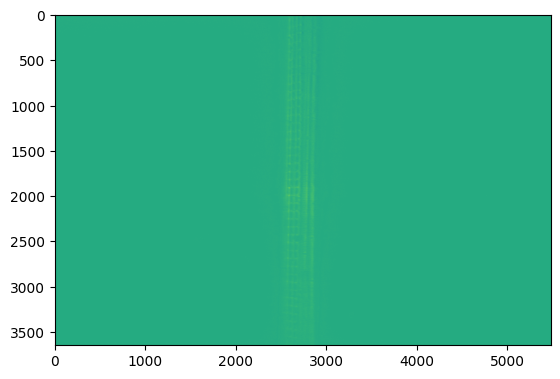

In [176]:
plt.imshow(np.double(image0V) - np.double(image10V))
plt.show()

# SCAN

In [130]:
uid = RE(scan([basler_5472], voltage_motor, 0, 10, 11))

In [132]:
uid = 'b1d2beb1-c5f6-4da8-b794-f00eb6b2122d'
db = tiled_client[uid]['primary']
images = db['basler_5472_image'].read()
voltage = db['galil_voltage_readback'].read()

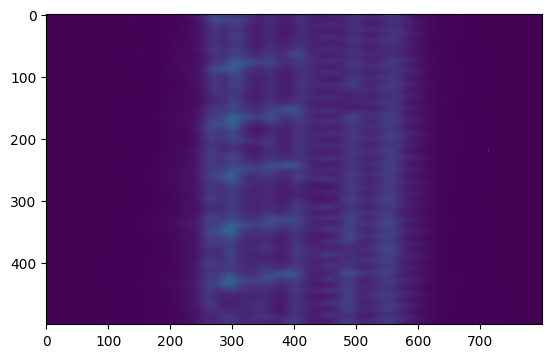

In [155]:
plt.imshow(images[0,1000:1500])

/home/bl531/python/nabla/wfs-als531/wfs_live.py:1032: UserWarning: k_peak=108.5 cyc/mm landed within 5% of k_ideal of a search-band edge [107.5, 241.9] cyc/mm. Consider increasing band_factor (currently 1.5).
  car = find_carrier(profile, dx, grating_pitch, band_factor=band_factor)


[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.6  SNR=44.0  f_pred=-0.91m  RMS_W=126.8nm  RMS_resid=1.192nm


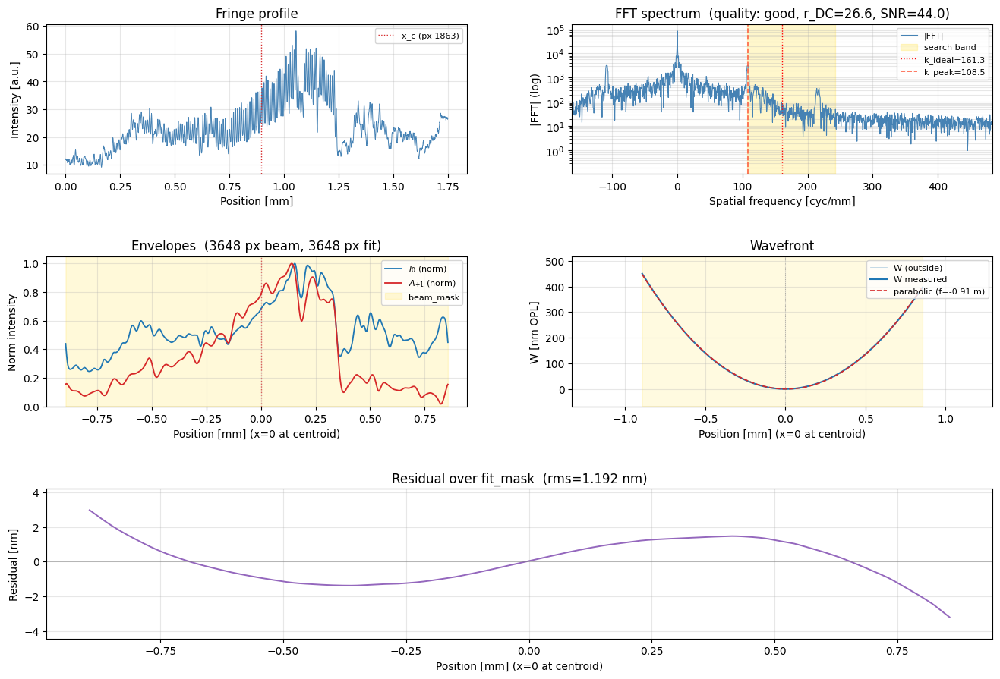

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.8  SNR=44.1  f_pred=-0.91m  RMS_W=126.9nm  RMS_resid=1.195nm


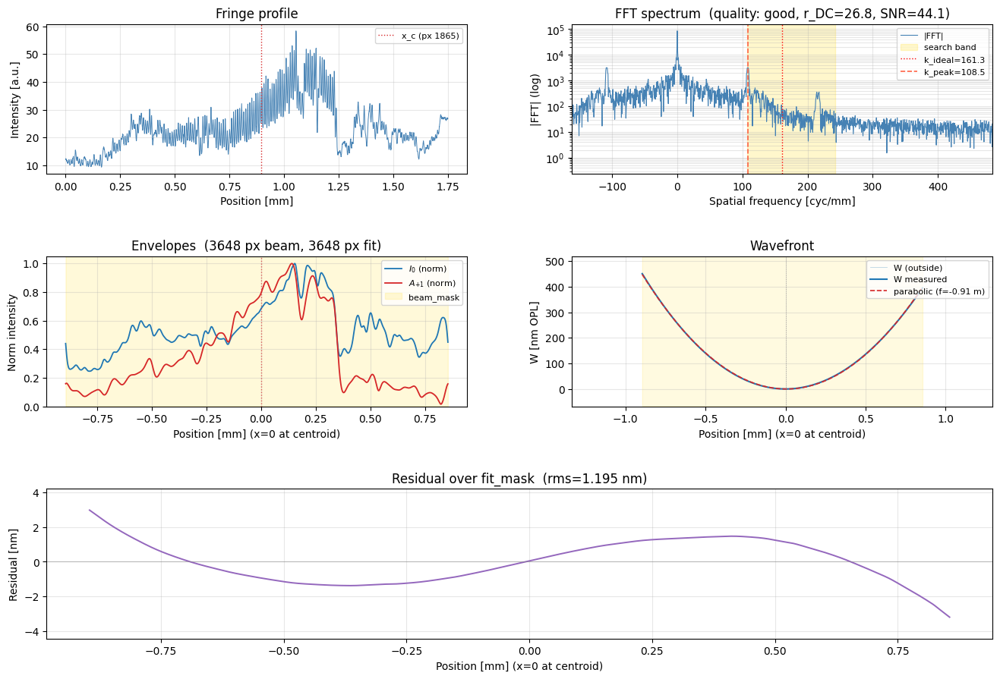

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.7  SNR=43.8  f_pred=-0.91m  RMS_W=126.8nm  RMS_resid=1.199nm


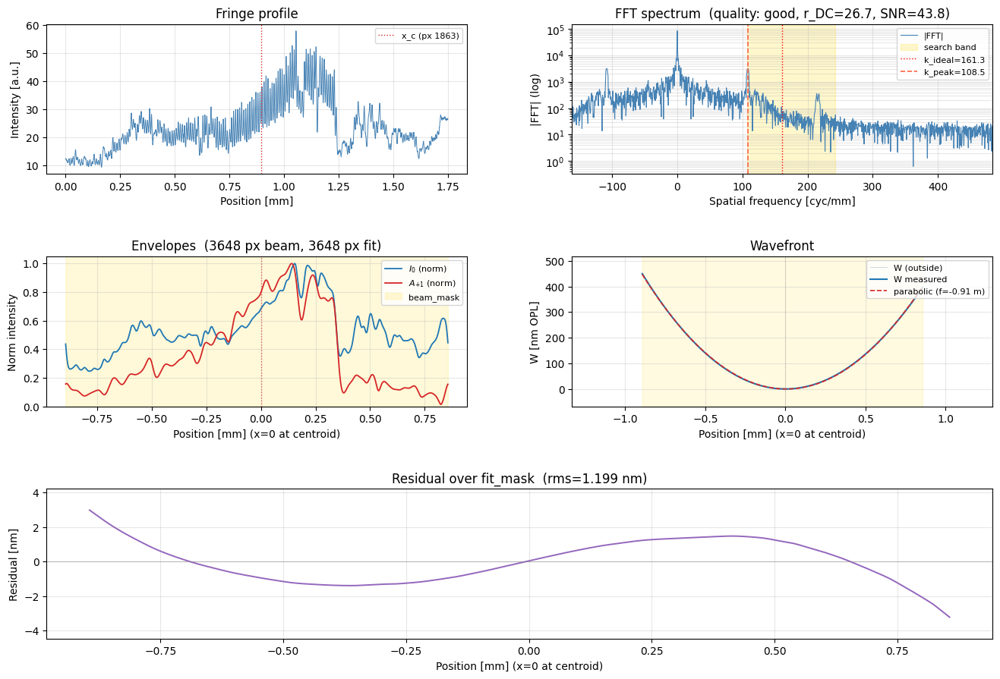

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.7  SNR=44.8  f_pred=-0.91m  RMS_W=126.9nm  RMS_resid=1.202nm


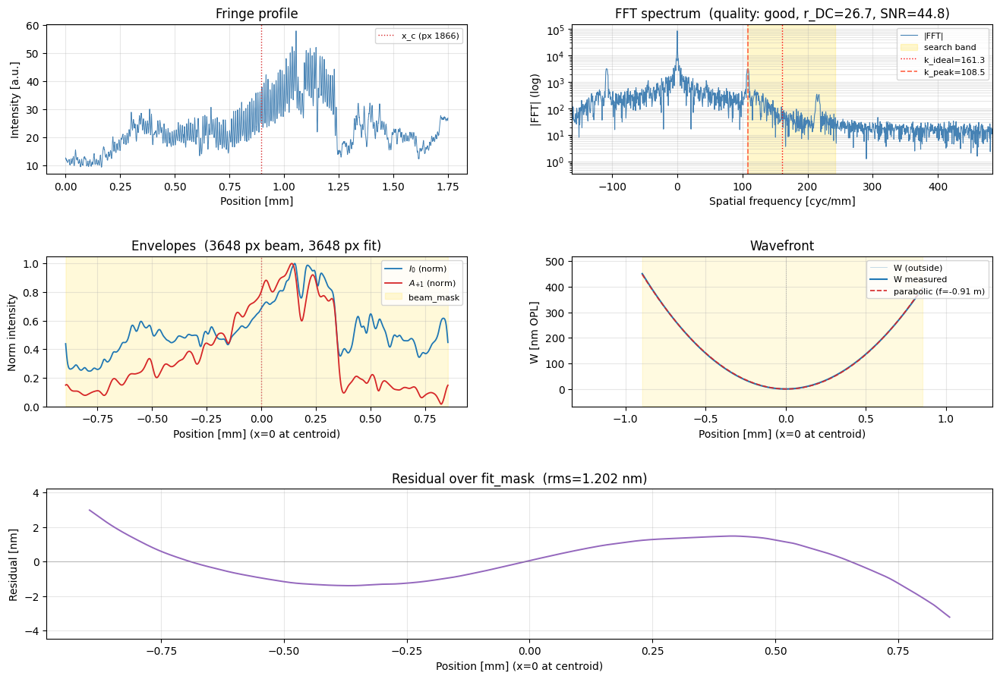

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.4  SNR=44.5  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.208nm


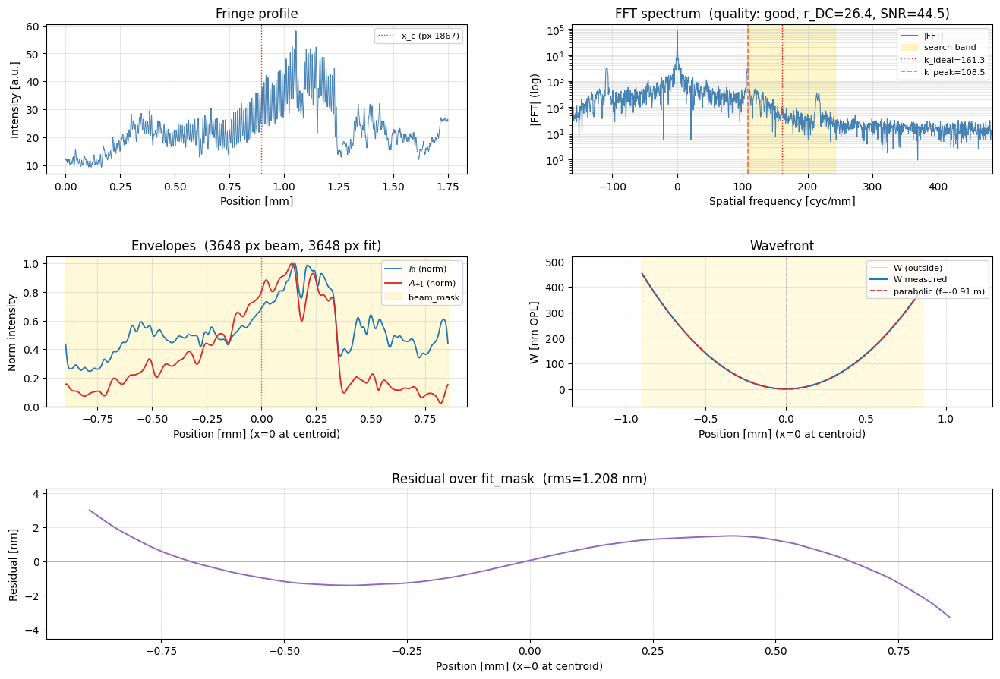

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=28.3  SNR=46.3  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.216nm


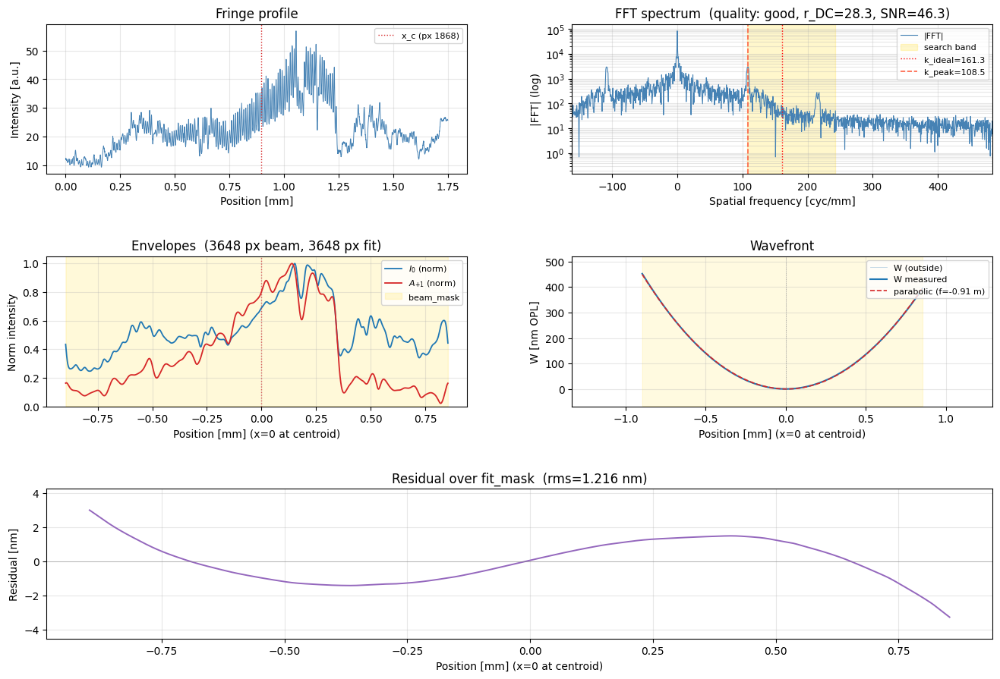

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.4  SNR=44.9  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.227nm


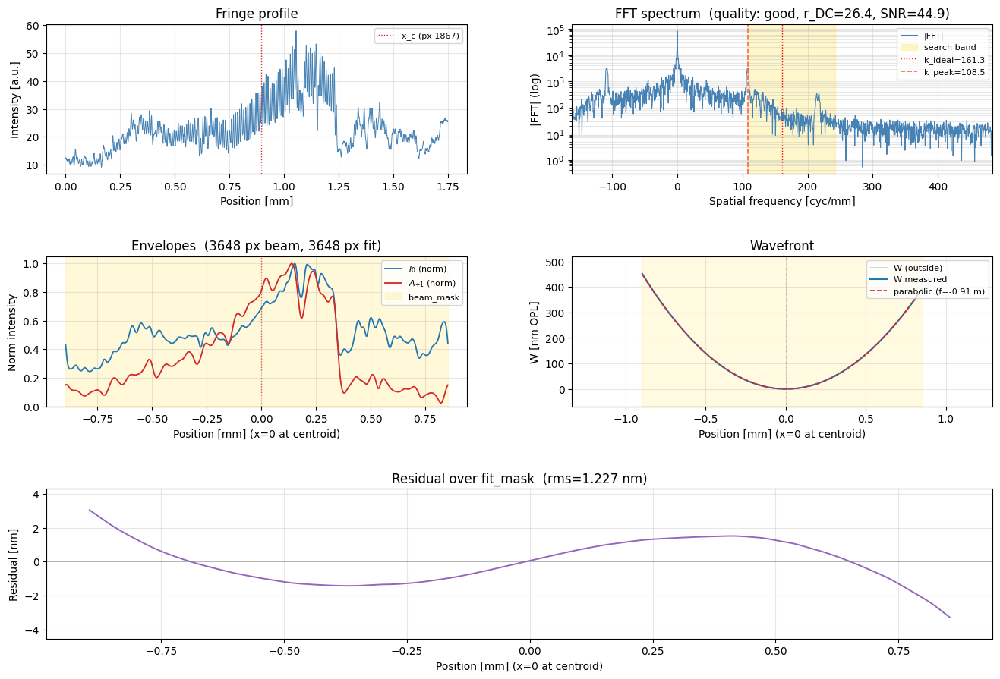

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.2  SNR=44.8  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.232nm


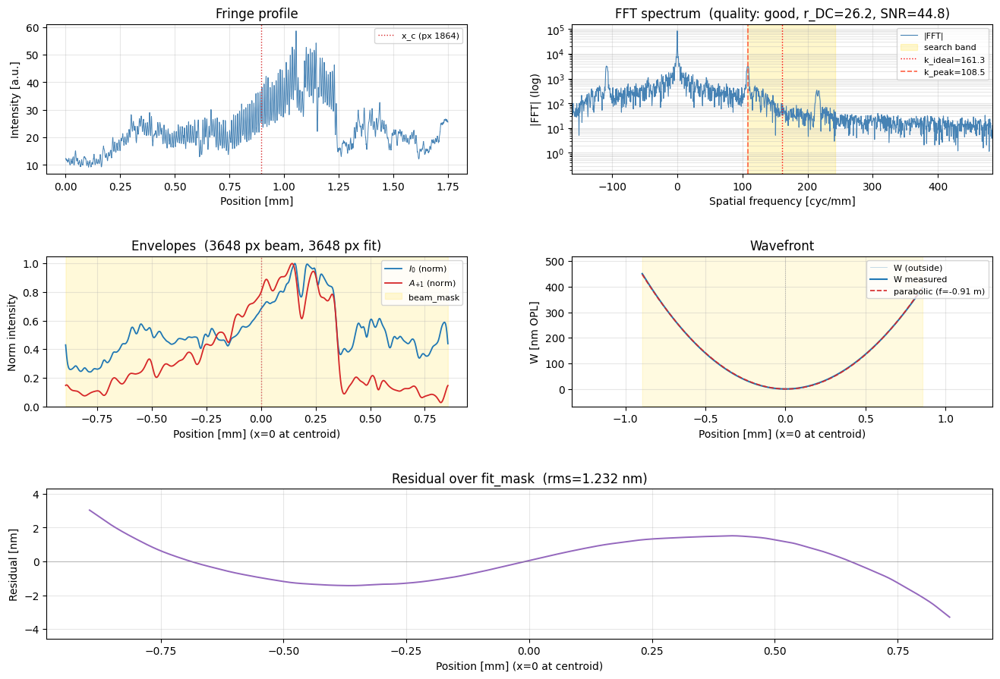

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.1  SNR=43.9  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.242nm


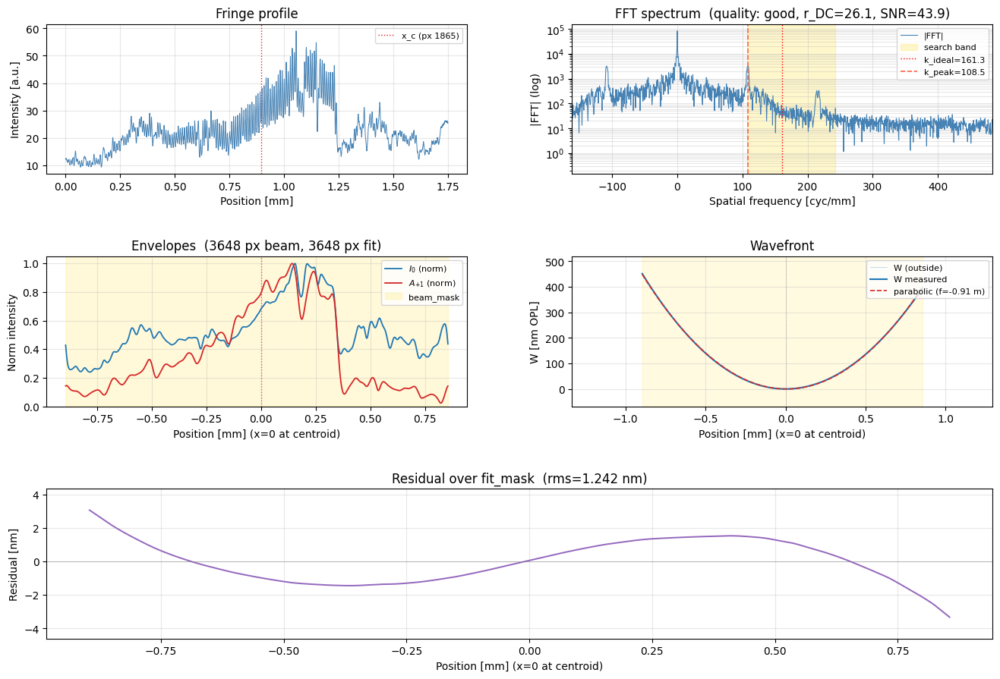

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=25.8  SNR=44.6  f_pred=-0.91m  RMS_W=127.3nm  RMS_resid=1.256nm


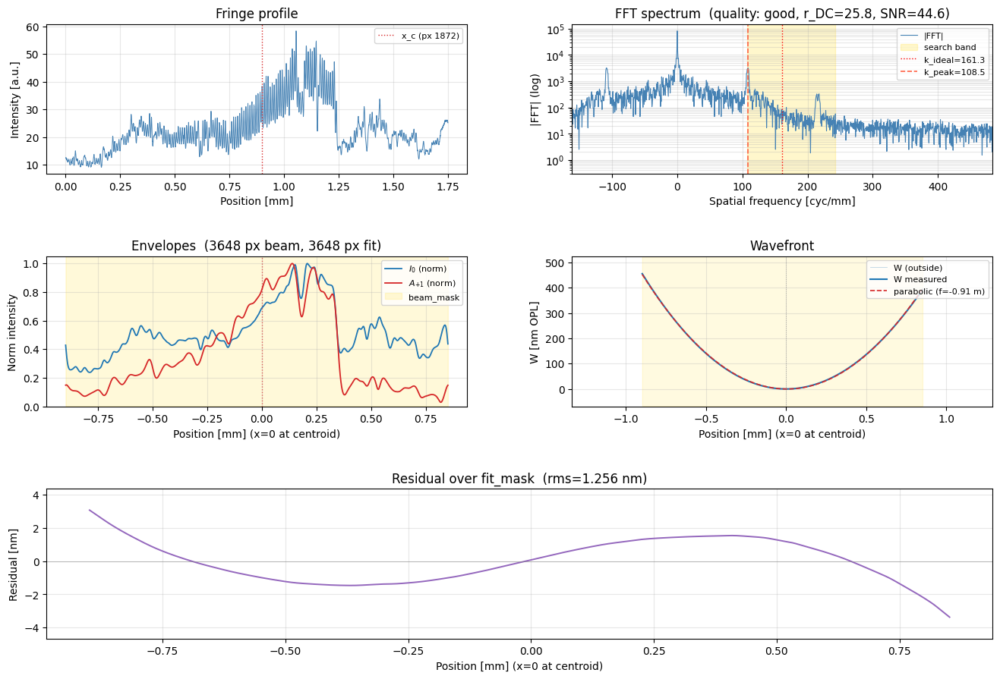

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.0  SNR=44.1  f_pred=-0.90m  RMS_W=127.5nm  RMS_resid=1.275nm


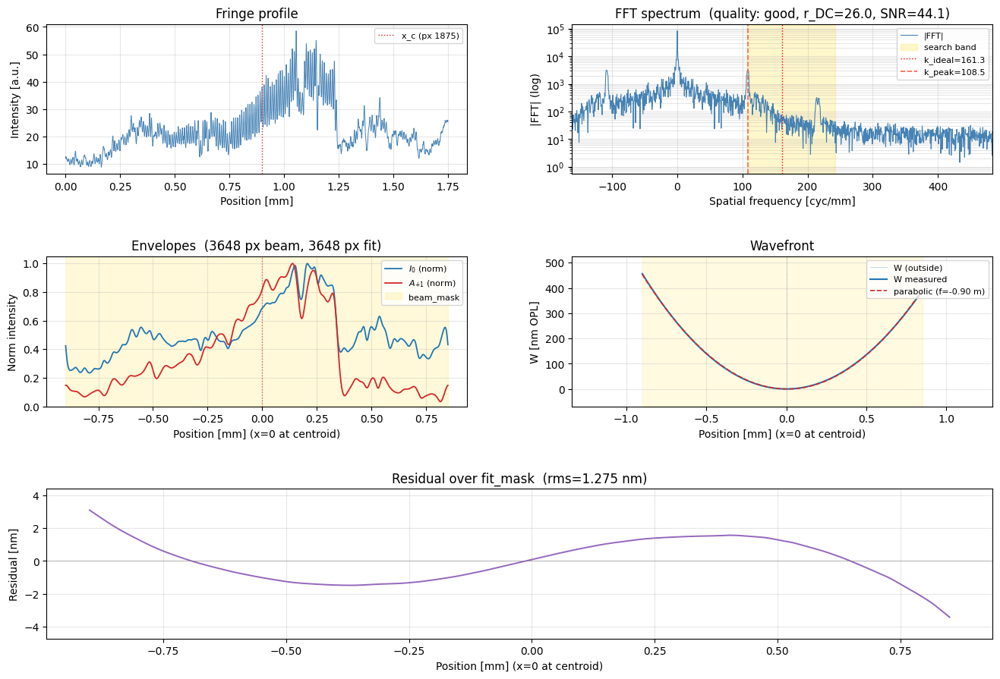

In [182]:
y_roi = slice(440, 460)
wfs_quicks = []
for img in images:
    r_quick = wfl.quick_look(
        img, dx_m, grating_pitch_m, wavelength_m, z_gd_m,
        y_roi=y_roi, axis=1, propagate=False, V_threshold=0
    )
    wfs_quicks.append(r_quick)

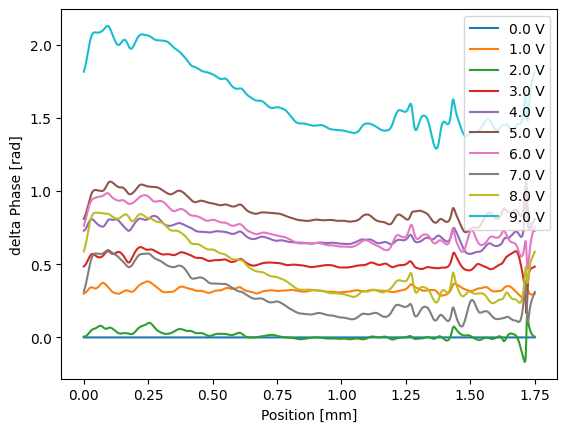

In [195]:
for i in range(10):
    delta_phi = wfs_quicks[i]['delta_phi'] - wfs_quicks[0]['delta_phi']
    plt.plot(x_m*1e3, delta_phi, label=f'{voltage[i]:.1f} V')
plt.xlabel('Position [mm]')
plt.ylabel('delta Phase [rad]')
plt.legend()

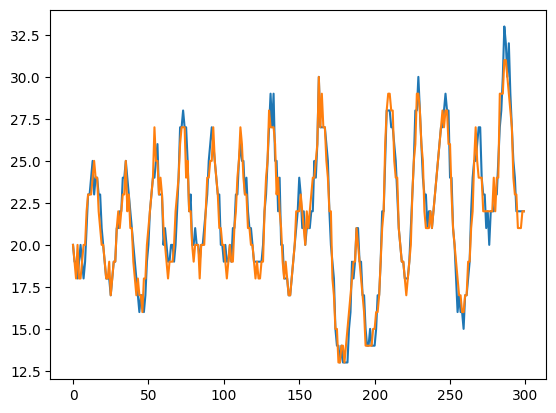

In [185]:
plt.plot(images[0,1100:1400,450])
plt.plot(images[1,1100:1400,450])

In [194]:
import bluesky.plan_stubs as bps
from bluesky.plans import scan
from functools import partial

def per_step_multi_image(detectors, motor, step, num_images=10):
    # Move the motor to the target position
    yield from bps.mv(motor, step)

    # Trigger and read the detector(s) num_images times at this position
    for i in range(num_images):
        yield from bps.trigger_and_read(list(detectors) + [motor])

# Bind num_images so it matches the per_step(detectors, motor, step) signature
per_step = partial(per_step_multi_image, num_images=10)

uid = RE(scan([basler_5472], voltage_motor, 0, 10, 11, per_step=per_step))

In [ ]:
print(uid)

('9c4a2d90-3a9f-4806-ab03-f64aaa83e057',)

In [ ]:
Obender.get()


EpicsMotorTuple(user_readback=-599.99604, user_setpoint=-600.0, user_offset=0.0, user_offset_dir=0, offset_freeze_switch=0, set_use_switch=0, velocity=100.0, acceleration=0.2, motor_egu='um', motor_is_moving=0, motor_done_move=1, high_limit_switch=0, low_limit_switch=0, high_limit_travel=5000.0, low_limit_travel=-2000.0, direction_of_travel=1, motor_stop=0, home_forward=0, home_reverse=0)

In [325]:
Obender.move(-1200)


MoveStatus(done=True, pos=bender_um, elapsed=26.4, success=True, settle_time=0.0)

In [9]:
voltage_motor_4.set(0)

NameError: name 'voltage_motor_4' is not defined

## Grid Scan with Two Morors

In [11]:
import gclib
from ophyd import Device, Component as Cpt, Signal
from ophyd.status import DeviceStatus
from bluesky import RunEngine
import bluesky.plans as bp
from ophyd.sim import det


class GalilVoltageMotor(Device):
    # The component that will hold our current voltage reading for Bluesky
    readback = Cpt(Signal, value=0.0, kind='hinted', metadata={'units': 'V'})

    def __init__(self, connection, channel, prefix="", *, name, **kwargs):
        self.galil = connection
        self.channel = channel
        super().__init__(prefix=prefix, name=name, **kwargs)

    def set(self, target_voltage):
        # Create a status object that Bluesky uses to track motion
        status = DeviceStatus(self)

        # Enforce the 0V to 5V safety limits
        if target_voltage < 0.0 or target_voltage > 10.0:
            status.set_exception(
                ValueError(f"Voltage {target_voltage}V is outside the 0V to 10V limit.")
            )
            return status

        try:
            # Send the voltage change command to the controller
            self.galil.GCommand(f'AO {self.channel},{target_voltage}')

            # Read the actual hardware state back to confirm
            response = self.galil.GCommand(f'MG @AO[{self.channel}]')
            try:
                actual_voltage = float(response.strip())
            except ValueError:
                actual_voltage = target_voltage

            # Update the readback signal and tell Bluesky the move is complete
            self.readback.put(actual_voltage)
            status.set_finished()
        except Exception as exc:
            status.set_exception(exc)

        return status

    def trigger(self):
        """
        Called by Bluesky before a data point is read. This is where
        hardware I/O to refresh the value should happen — NOT in read().
        """
        status = DeviceStatus(self)
        try:
            response = self.galil.GCommand(f'MG @AO[{self.channel}]')
            try:
                actual_voltage = float(response.strip())
                self.readback.put(actual_voltage)
            except ValueError:
                pass
            status.set_finished()
        except Exception as exc:
            status.set_exception(exc)
        return status

    # No need to override read() — Device.read() will report the
    # last value stored in `readback` cheaply, without doing I/O.


# Establish the connection
connection = gclib.py()
connection.GOpen('192.168.10.123')

# Instantiate the custom motor device
voltage_motor_4 = GalilVoltageMotor(connection=connection, channel=4, name='galil_voltage_4')

# Example usage:
# RE = RunEngine({})
# RE(bp.count([voltage_motor], num=5))
# RE(bp.scan([det], voltage_motor, 0, 5, 11))

In [12]:
voltage_motor_4.set(0)

DeviceStatus(device=galil_voltage_4, done=True, success=True)

In [336]:
Obender.get()

EpicsMotorTuple(user_readback=-1199.9889, user_setpoint=-1200.0, user_offset=0.0, user_offset_dir=0, offset_freeze_switch=0, set_use_switch=0, velocity=100.0, acceleration=0.2, motor_egu='um', motor_is_moving=0, motor_done_move=1, high_limit_switch=0, low_limit_switch=0, high_limit_travel=5000.0, low_limit_travel=-2000.0, direction_of_travel=1, motor_stop=0, home_forward=0, home_reverse=0)

In [337]:
Obender.move(-600)

MoveStatus(done=True, pos=bender_um, elapsed=8.5, success=True, settle_time=0.0)

In [348]:
voltage_motor_4.set(0)

DeviceStatus(device=galil_voltage, done=True, success=True)

In [347]:
voltage_motor.set(0)

DeviceStatus(device=galil_voltage, done=True, success=True)

In [351]:
RE(bp.count([basler_5472], 1))

('cc2aca55-7969-46fa-aa97-f673cb85f6b4',)

In [353]:
uid = 'cc2aca55-7969-46fa-aa97-f673cb85f6b4'
db = tiled_client[uid]['primary']
images = db['basler_5472_image'].read()
# voltage = db['galil_voltage_readback'].read()



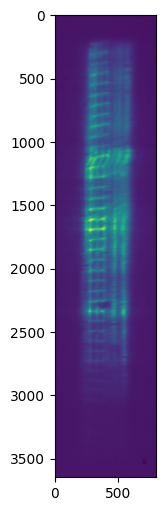

In [356]:
plt.figure(figsize=(8, 6))
plt.imshow(images[0])

In [8]:
import bluesky.plan_stubs as bps
from bluesky.plans import grid_scan
from functools import partial

def per_step_multi_image(detectors, step, pos_cache, num_images=10):
    # Move all motors for this step (handles caching to avoid redundant moves)
    yield from bps.move_per_step(step, pos_cache)

    # Trigger and read the detector(s) num_images times at this position
    motors = list(step.keys())
    for i in range(num_images):
        yield from bps.trigger_and_read(list(detectors) + motors)

per_step = partial(per_step_multi_image, num_images=10)

uid = RE(grid_scan(
    [basler_5472],
    voltage_motor, 0, 10, 11,
    voltage_motor_4, 0, 10, 11,
    snake_axes=False,
    per_step=per_step,
))



Transient Scan ID: 1     Time: 2026-07-01 18:52:07
Persistent Unique Scan ID: '1b359a54-9004-4d23-8dd7-1bb72cdeeeda'
New stream: 'baseline'
Start-of-run baseline readings:
+--------------------------------+--------------------------------+
|              mono_angle_offset | 6.597347761216428              |
|                          diode | -0.3998                        |
|          mono_energy_energy_eV | 8089.634247877096              |
|         mono_energy_mono_angle | 20.746                         |
|                     sampleJack | 25.0                           |
|         gi_angle_grazing_angle | -0.12000384836979192           |
|   gi_angle_hexapod_ry_readback | -0.12000384836979192           |
|      hexapod_motor_Tx_readback | 0.00040253453711666665         |
|      hexapod_motor_Ty_readback | -3.0000011718268054            |
|      hexapod_motor_Tz_readback | -2.8000011586760394            |
|      hexapod_motor_Rx_readback | -0.00012708604838113227        |
|      hex

In [70]:
Obender.get()

EpicsMotorTuple(user_readback=-600.0135300000001, user_setpoint=-600.0, user_offset=0.0, user_offset_dir=0, offset_freeze_switch=0, set_use_switch=0, velocity=100.0, acceleration=0.2, motor_egu='um', motor_is_moving=0, motor_done_move=1, high_limit_switch=0, low_limit_switch=0, high_limit_travel=5000.0, low_limit_travel=-2000.0, direction_of_travel=1, motor_stop=0, home_forward=0, home_reverse=0)

In [76]:
Obender.move(-800)

MoveStatus(done=True, pos=bender_um, elapsed=6.4, success=True, settle_time=0.0)

# ANALYSIS

In [78]:
from PIL import Image

# Load TIFF Image
filename = "wfs_1s__2026-07-02__11-40-21.tiff"
im = Image.open(f'{filename}')
width, height = im.size

print(f"Loaded: {filename}")
print(f"Image dimensions: {width} × {height} pixels")


Loaded: wfs_1s__2026-07-02__11-40-21.tiff
Image dimensions: 1200 × 3672 pixels


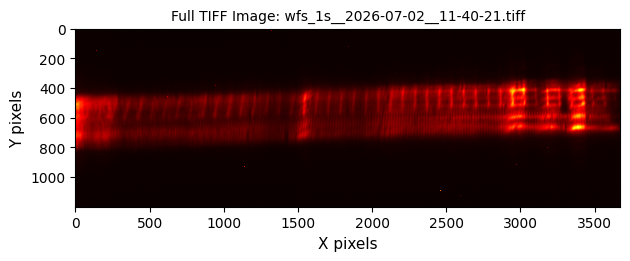

CA.Client.Exception...............................................
    Context: "192.168.10.124:34707"
    Source File: modules/ca/src/client/cac.cpp line 1237
    Current Time: Thu Jul 02 2026 13:04:10.692041526
..................................................................
CA.Client.Exception...............................................
    Context: "192.168.10.124:43487"
    Source File: modules/ca/src/client/cac.cpp line 1237
    Current Time: Thu Jul 02 2026 13:05:44.687323150
..................................................................
CA.Client.Exception...............................................
    Context: "192.168.10.124:37913"
    Source File: modules/ca/src/client/cac.cpp line 1237
    Current Time: Thu Jul 02 2026 13:08:12.053308545
..................................................................
CA.Client.Exception...............................................
    Context: "192.168.10.124:41641"
    Source File: modules/ca/src/client/cac.cpp line 1237


In [80]:
# Visualize full image
# plt.figure(figsize=(8, 5))
plt.imshow(np.array(im).T, cmap='hot', interpolation='nearest')
plt.title(f'Full TIFF Image: {filename}', fontsize=10)
plt.xlabel('X pixels', fontsize=11)
plt.ylabel('Y pixels', fontsize=11)
# plt.colorbar(label='Intensity [counts]')
plt.tight_layout()
plt.show()

## Single Motor, One Frame per Voltage

In [198]:
uid = 'b1d2beb1-c5f6-4da8-b794-f00eb6b2122d'
db = tiled_client[uid]['primary']
images = db['basler_5472_image'].read()
voltage = db['galil_voltage_readback'].read()

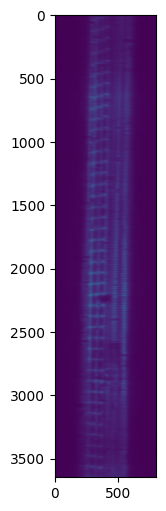

In [210]:
plt.figure(figsize=(8, 6))
plt.imshow(images[0])

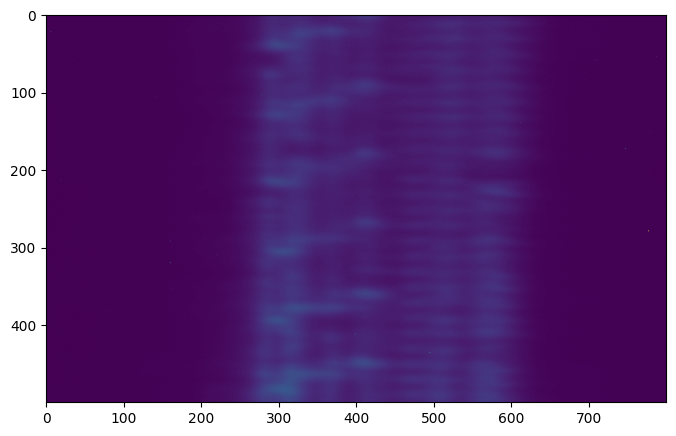

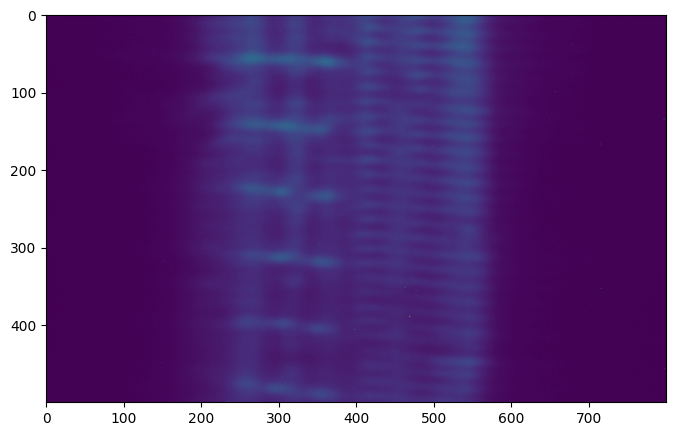

In [248]:
plt.figure(figsize=(8, 6))
plt.imshow(images[0,0:500])
# plt.xvline(450, color='r', linestyle='--')

plt.figure(figsize=(8, 6))
plt.imshow(images[0,3000:3500])

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=38.7  SNR=35.7  f_pred=-0.89m  RMS_W=142.2nm  RMS_resid=1.272nm


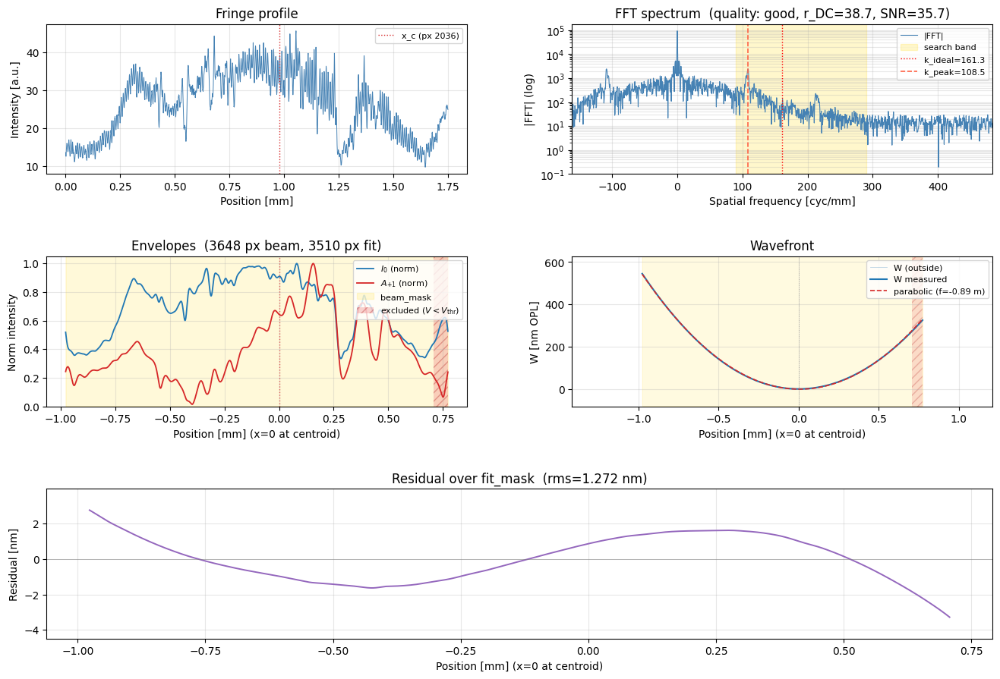

2036


In [ ]:
y_roi = slice(480, 500)

r_quick_0 = wfl.quick_look(
    images[0], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
    y_roi=y_roi, axis=1, propagate=False, V_threshold=0.4
)

x_c_ref = r_quick_0['x_c']
print(x_c_ref)

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=38.7  SNR=35.7  f_pred=-0.89m  RMS_W=142.2nm  RMS_resid=1.422nm


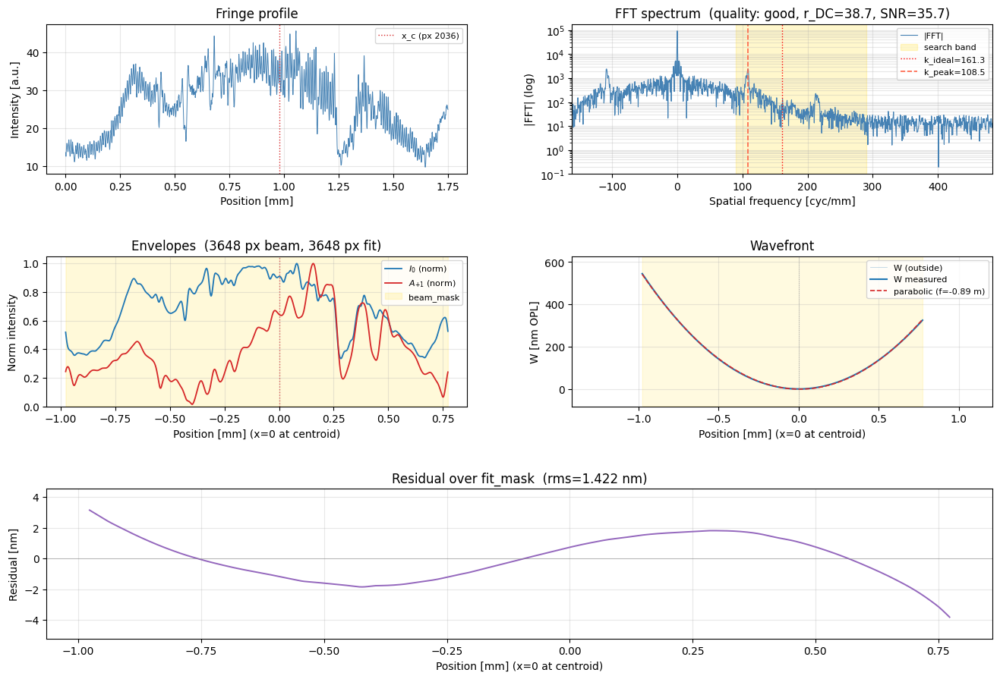

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=39.2  SNR=36.1  f_pred=-0.89m  RMS_W=142.2nm  RMS_resid=1.428nm


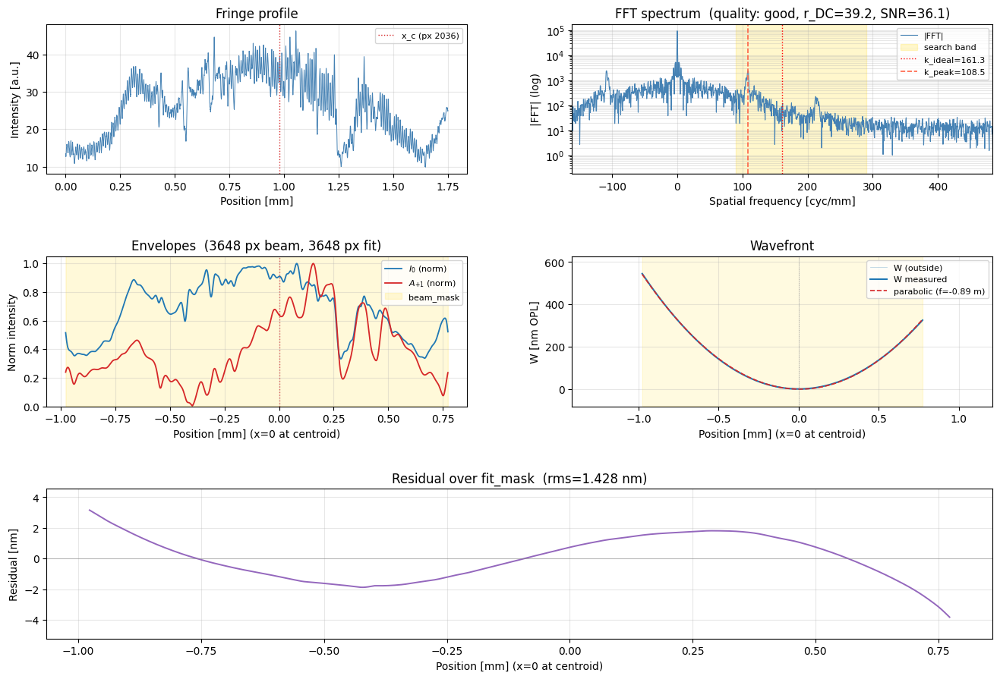

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=39.1  SNR=35.4  f_pred=-0.89m  RMS_W=142.2nm  RMS_resid=1.432nm


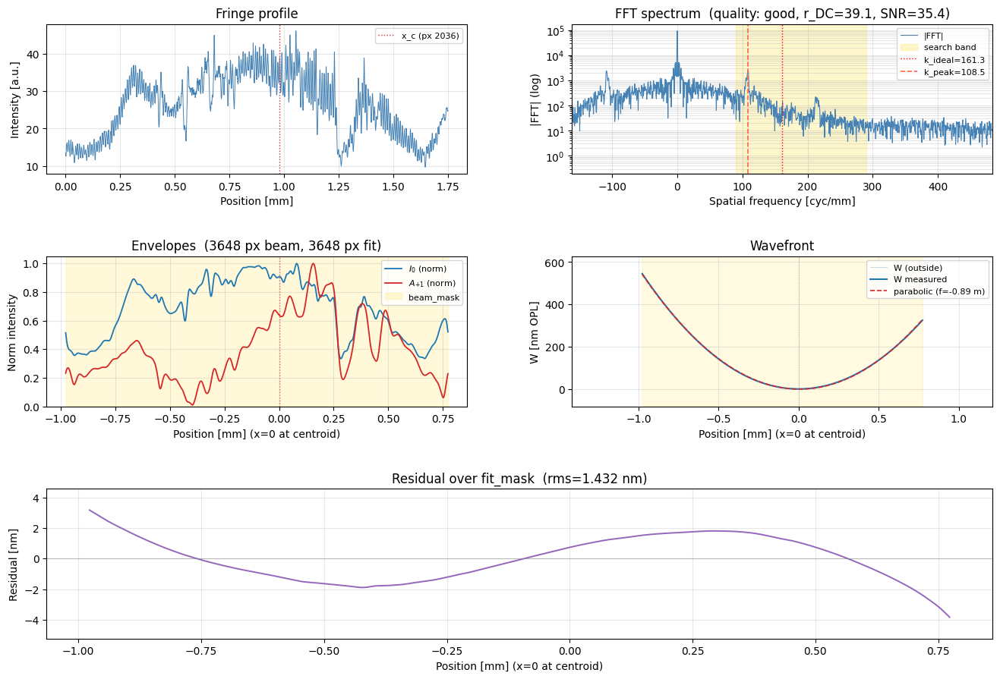

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=39.0  SNR=35.7  f_pred=-0.89m  RMS_W=142.2nm  RMS_resid=1.437nm


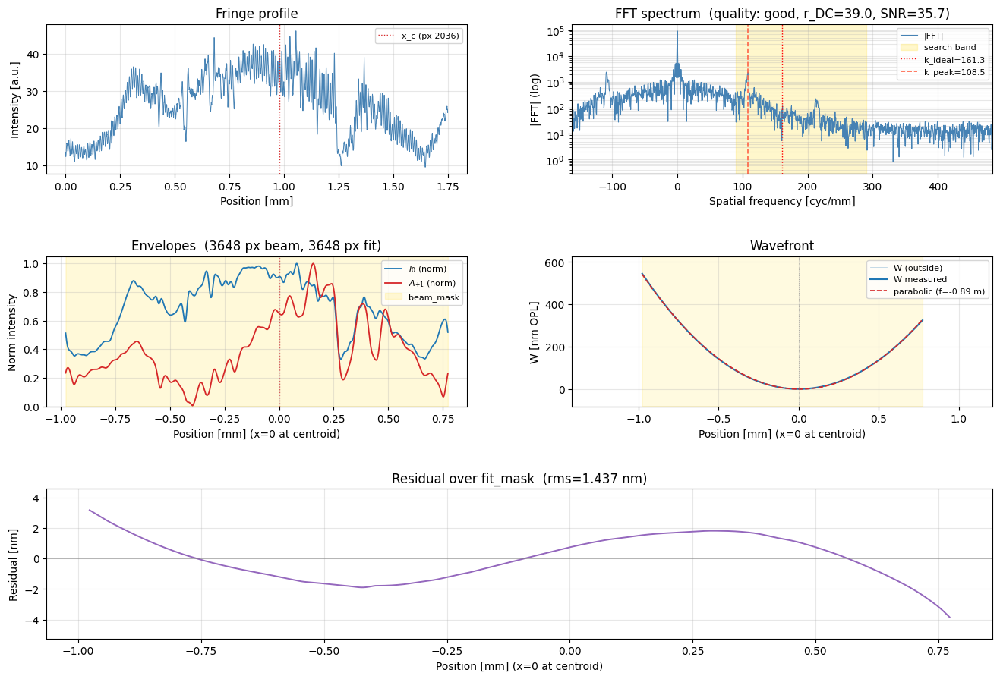

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=38.9  SNR=36.5  f_pred=-0.89m  RMS_W=142.2nm  RMS_resid=1.439nm


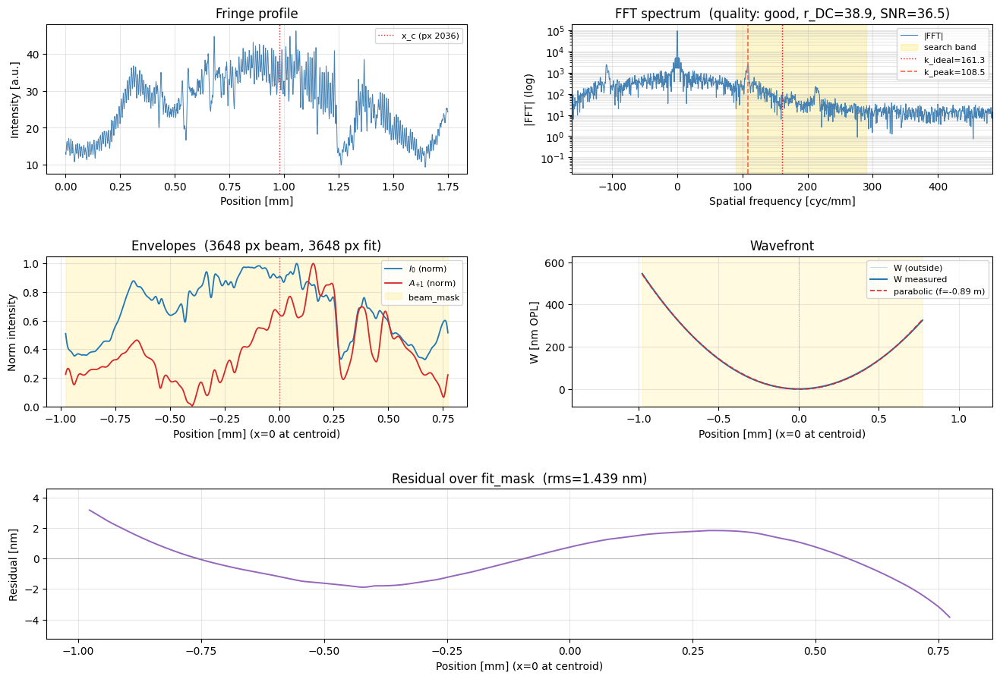

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=41.4  SNR=37.8  f_pred=-0.89m  RMS_W=142.3nm  RMS_resid=1.450nm


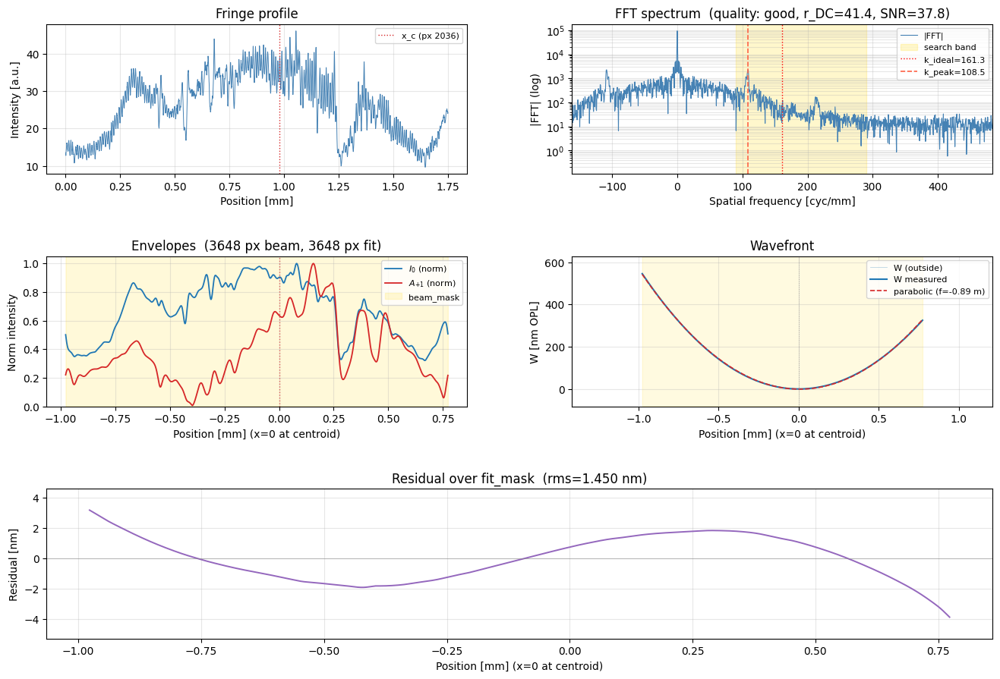

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=38.4  SNR=37.0  f_pred=-0.89m  RMS_W=142.3nm  RMS_resid=1.456nm


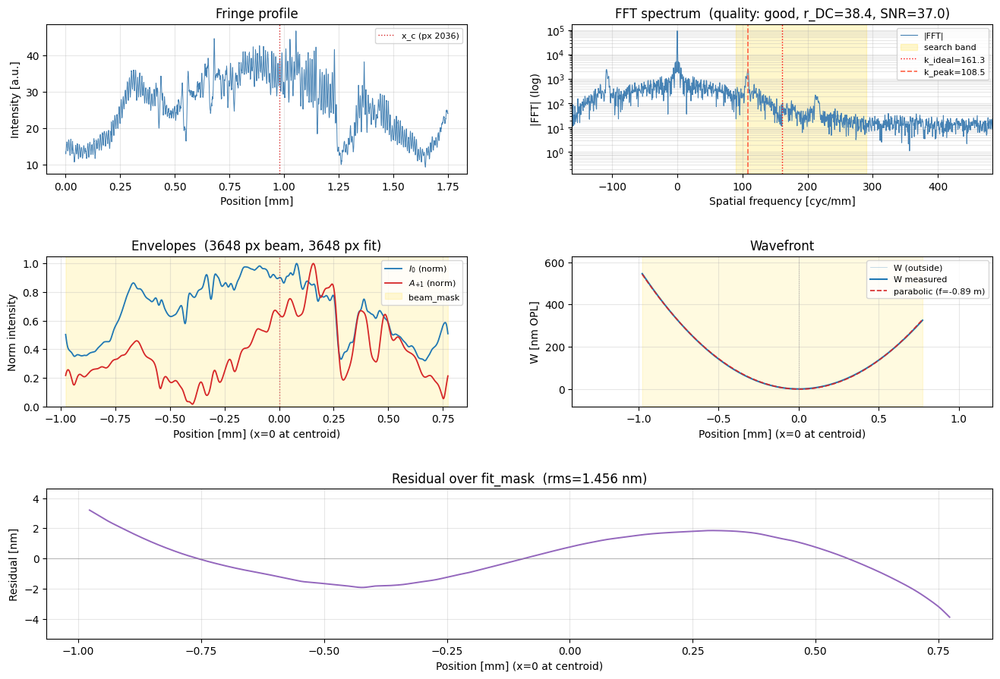

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=37.8  SNR=36.2  f_pred=-0.89m  RMS_W=142.3nm  RMS_resid=1.464nm


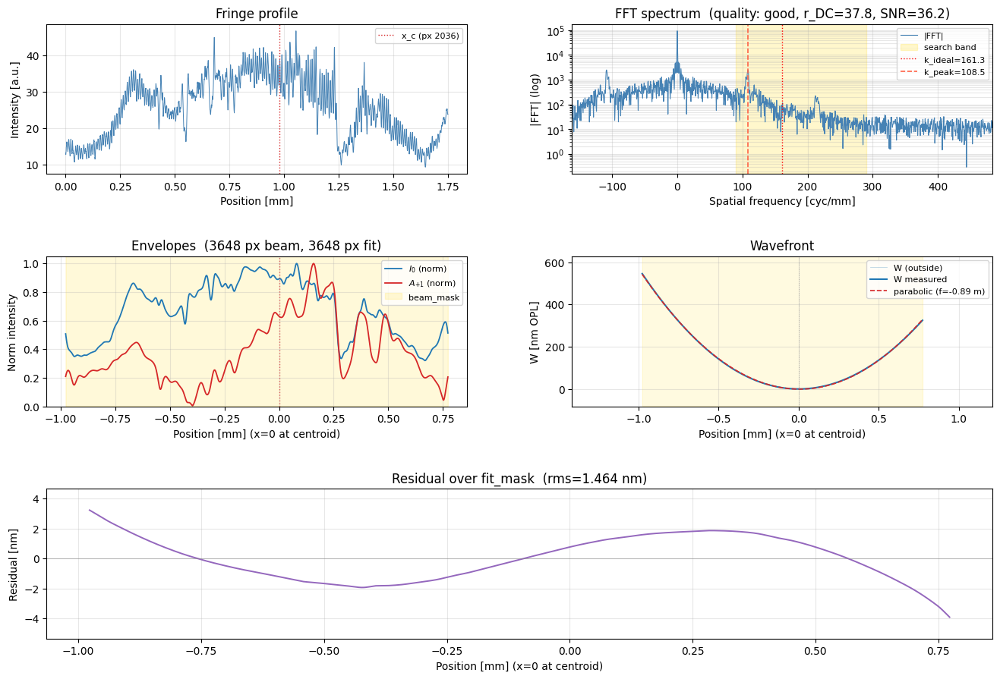

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=37.4  SNR=36.9  f_pred=-0.89m  RMS_W=142.4nm  RMS_resid=1.476nm


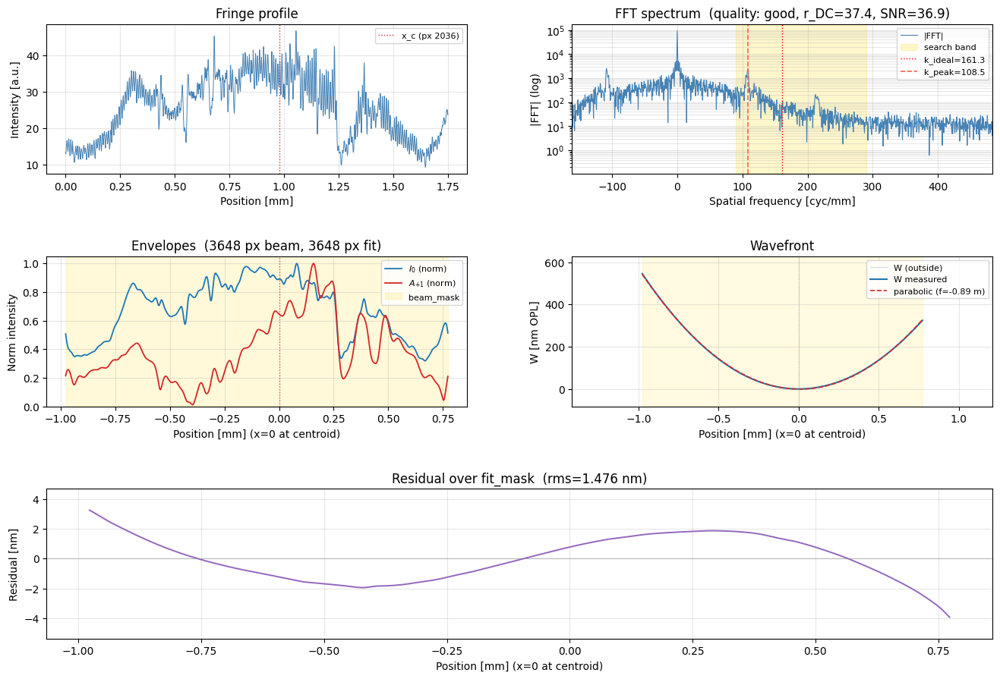

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=37.0  SNR=37.1  f_pred=-0.89m  RMS_W=142.4nm  RMS_resid=1.489nm


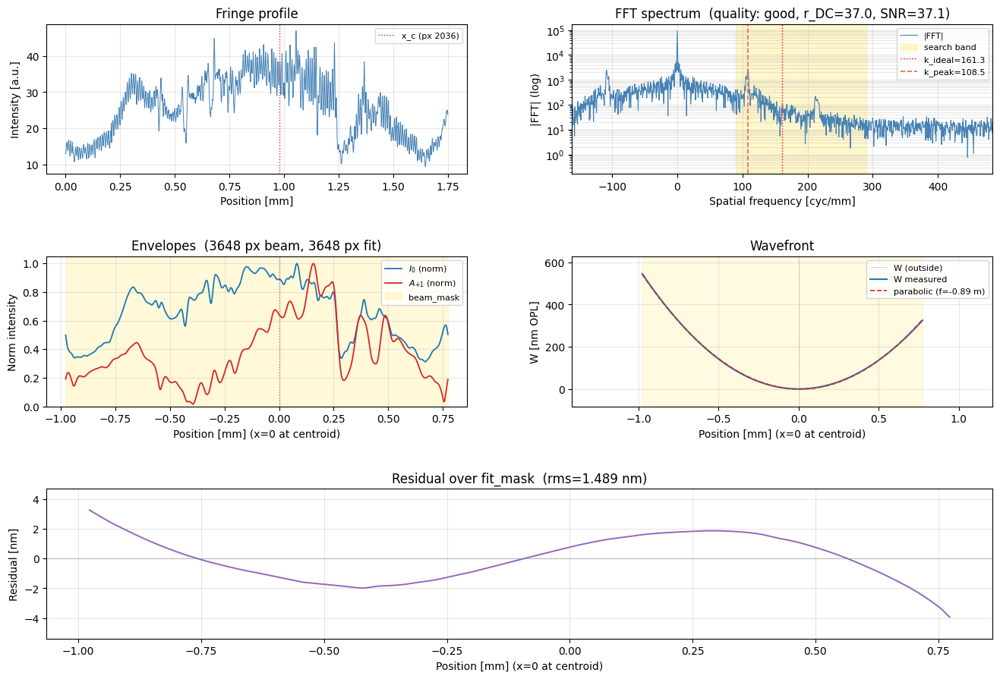

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=36.6  SNR=37.9  f_pred=-0.89m  RMS_W=142.5nm  RMS_resid=1.503nm


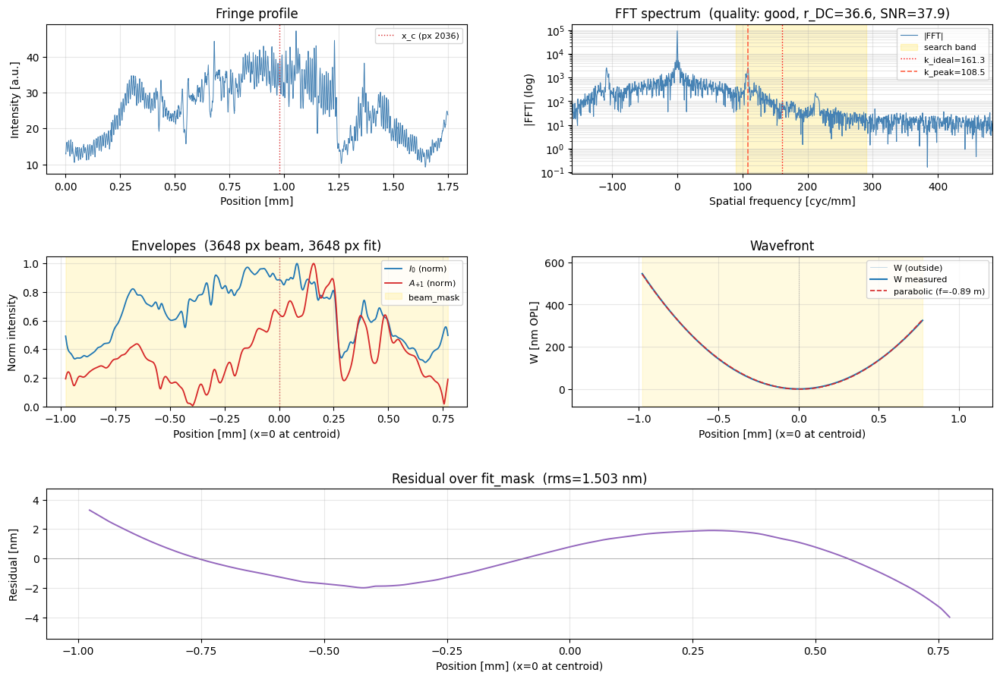

In [234]:
x_c_ref = r_quick_0['x_c']

wfs_quicks = []
for img in images:
    r_quick = wfl.quick_look(
        img, dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
        x_c_override = x_c_ref, 
        y_roi=y_roi, axis=1, propagate=False, V_threshold=0
    )
    wfs_quicks.append(r_quick)

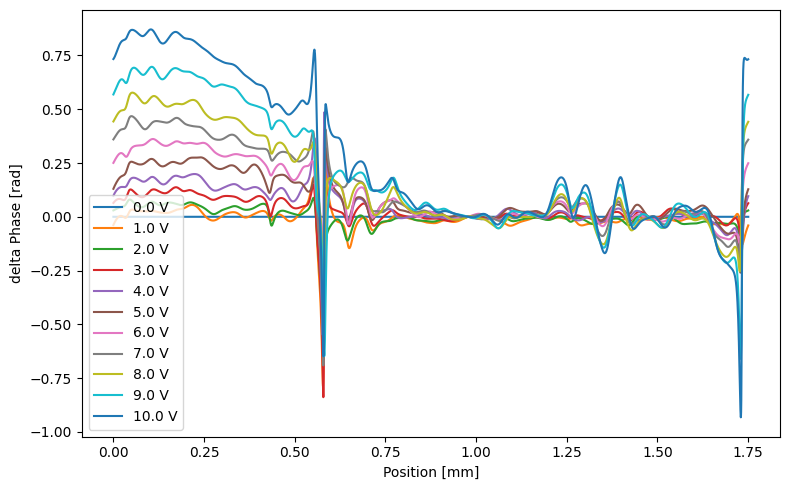

In [235]:
plt.figure(figsize=(8, 5))
for i in range(11):
    delta_phi = wfs_quicks[i]['delta_phi'] - wfs_quicks[0]['delta_phi']
    plt.plot(x_m*1e3, delta_phi, label=f'{voltage[i]:.1f} V')
plt.xlabel('Position [mm]')
plt.ylabel('delta Phase [rad]')
plt.legend()
plt.tight_layout(); plt.show()

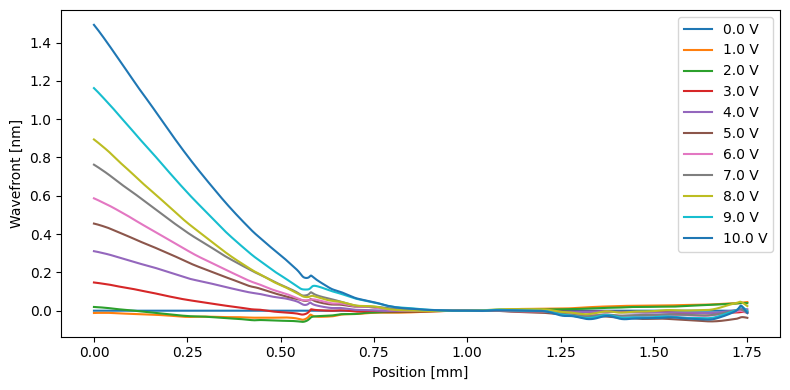

In [236]:
plt.figure(figsize=(8, 4))
for i in range(11):
    delta_phi = wfs_quicks[i]['W_nm'] - wfs_quicks[0]['W_nm']
    plt.plot(x_m*1e3, delta_phi, label=f'{voltage[i]:.1f} V')
plt.xlabel('Position [mm]')
plt.ylabel('Wavefront [nm]')
plt.legend()
plt.tight_layout(); plt.show()

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.6  SNR=44.0  f_pred=-0.89m  RMS_W=126.8nm  RMS_resid=0.372nm


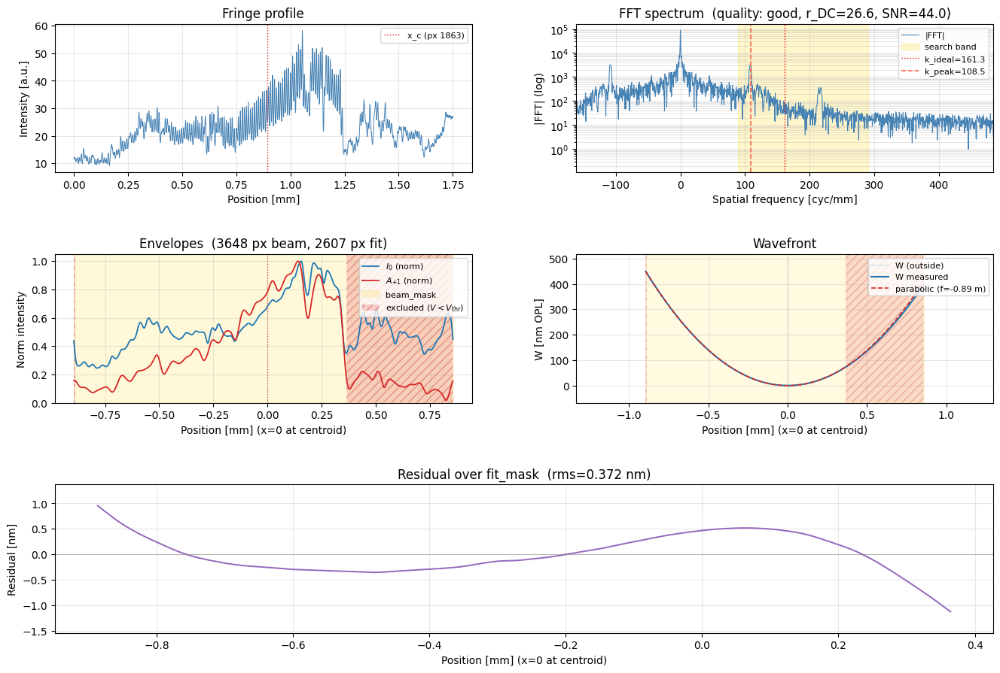

1863
[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.6  SNR=44.0  f_pred=-0.91m  RMS_W=126.8nm  RMS_resid=1.192nm


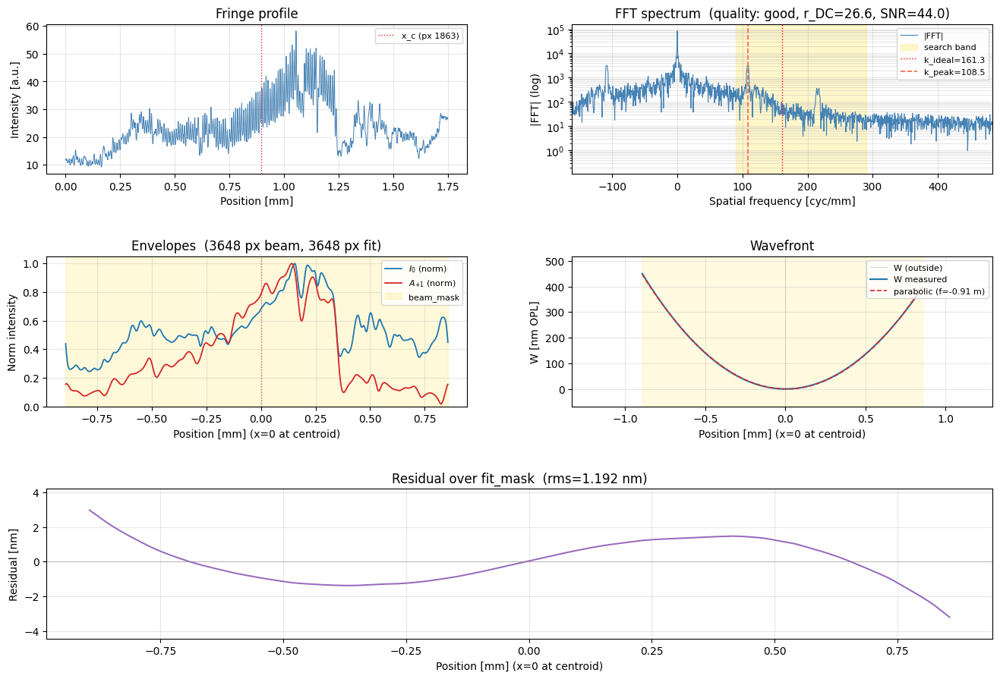

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.8  SNR=44.1  f_pred=-0.91m  RMS_W=126.8nm  RMS_resid=1.195nm


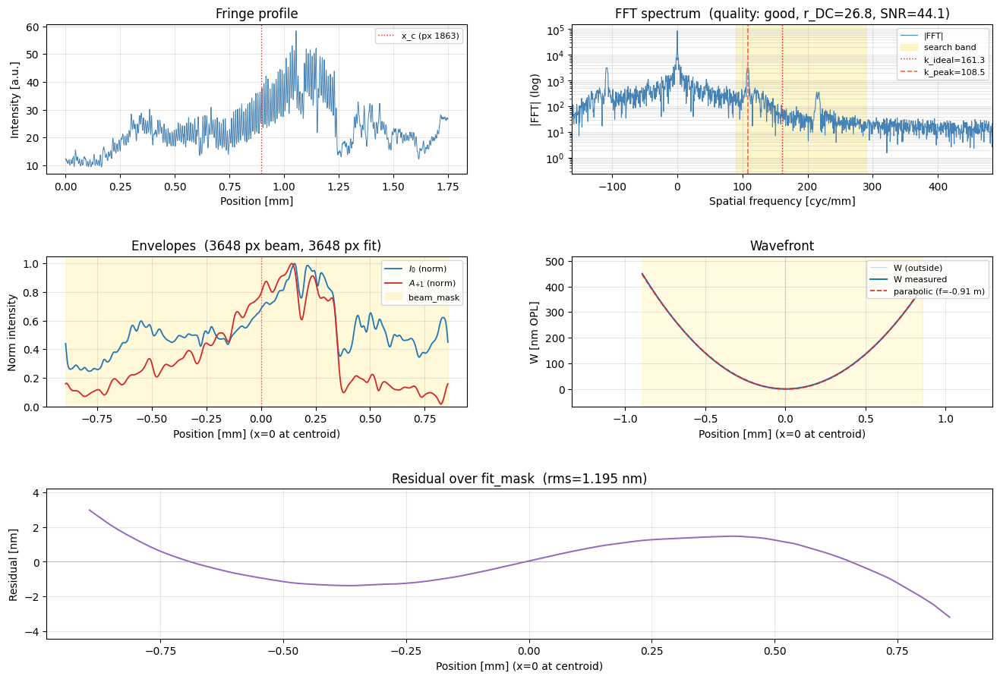

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.7  SNR=43.8  f_pred=-0.91m  RMS_W=126.8nm  RMS_resid=1.199nm


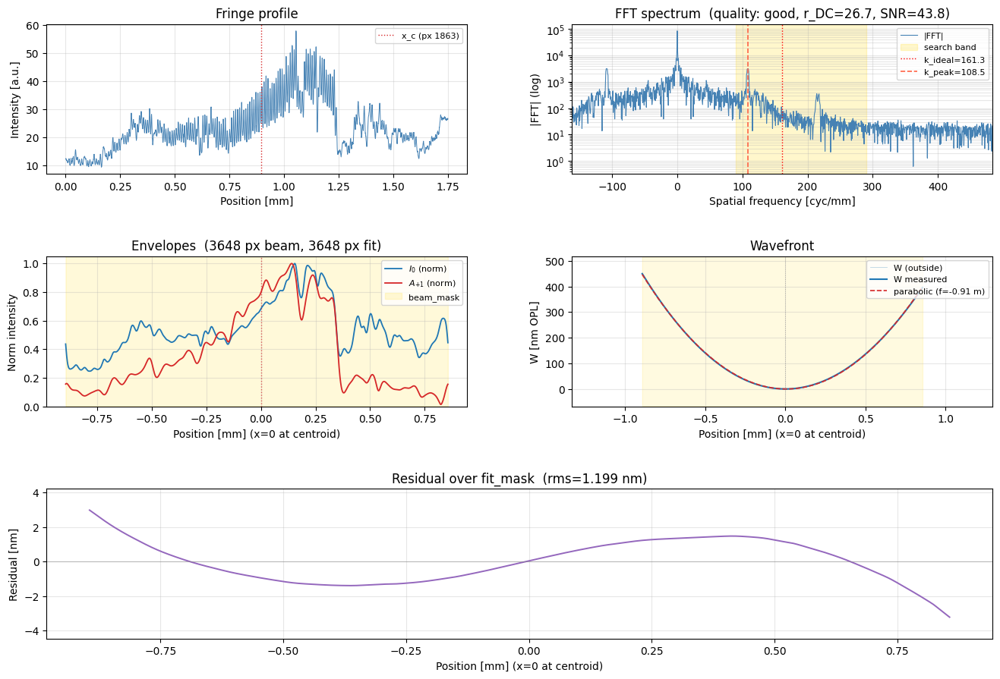

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.7  SNR=44.8  f_pred=-0.91m  RMS_W=126.9nm  RMS_resid=1.202nm


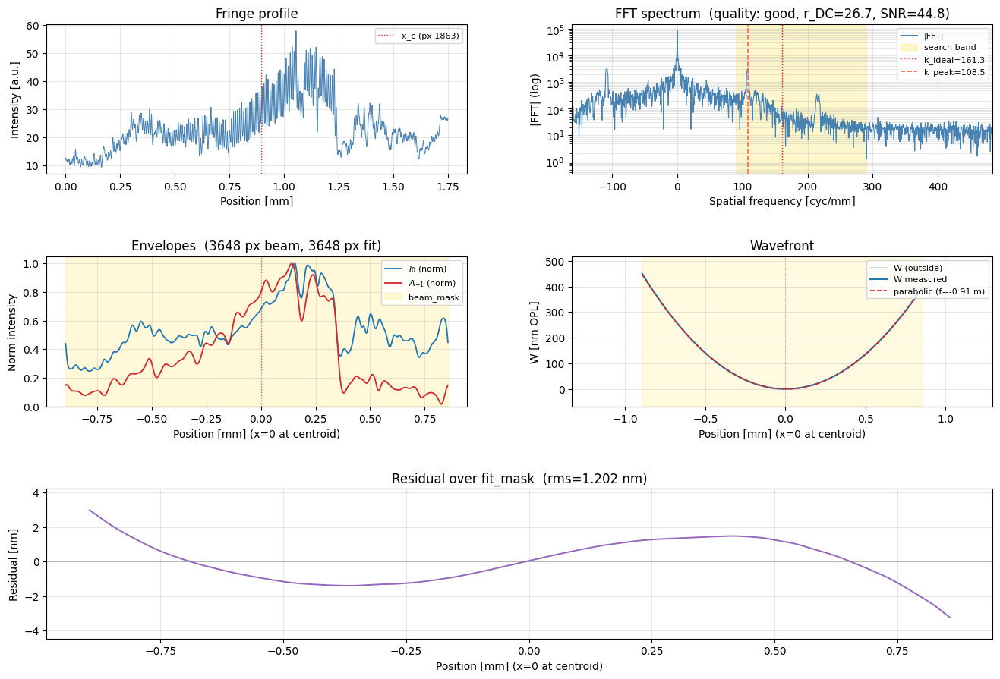

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.4  SNR=44.5  f_pred=-0.91m  RMS_W=126.9nm  RMS_resid=1.208nm


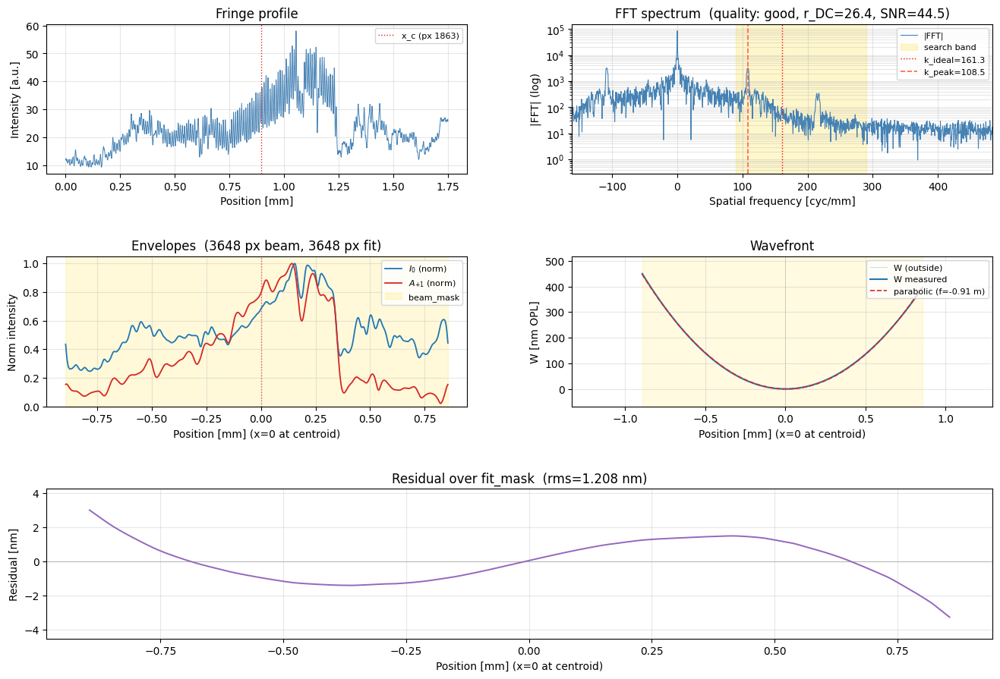

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=28.3  SNR=46.3  f_pred=-0.91m  RMS_W=126.9nm  RMS_resid=1.216nm


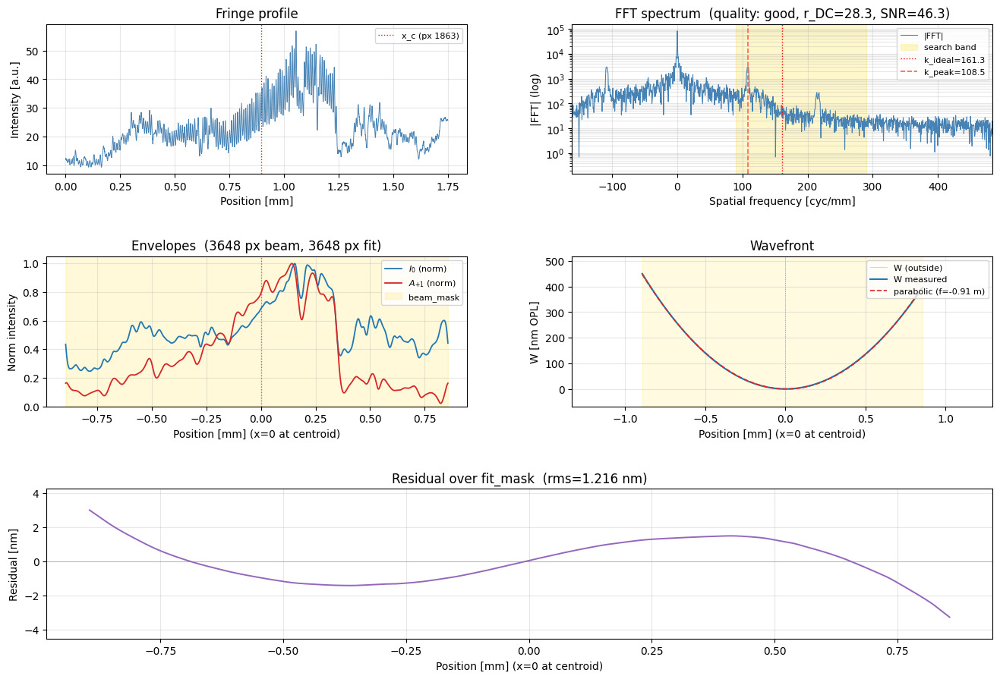

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.4  SNR=44.9  f_pred=-0.91m  RMS_W=126.9nm  RMS_resid=1.227nm


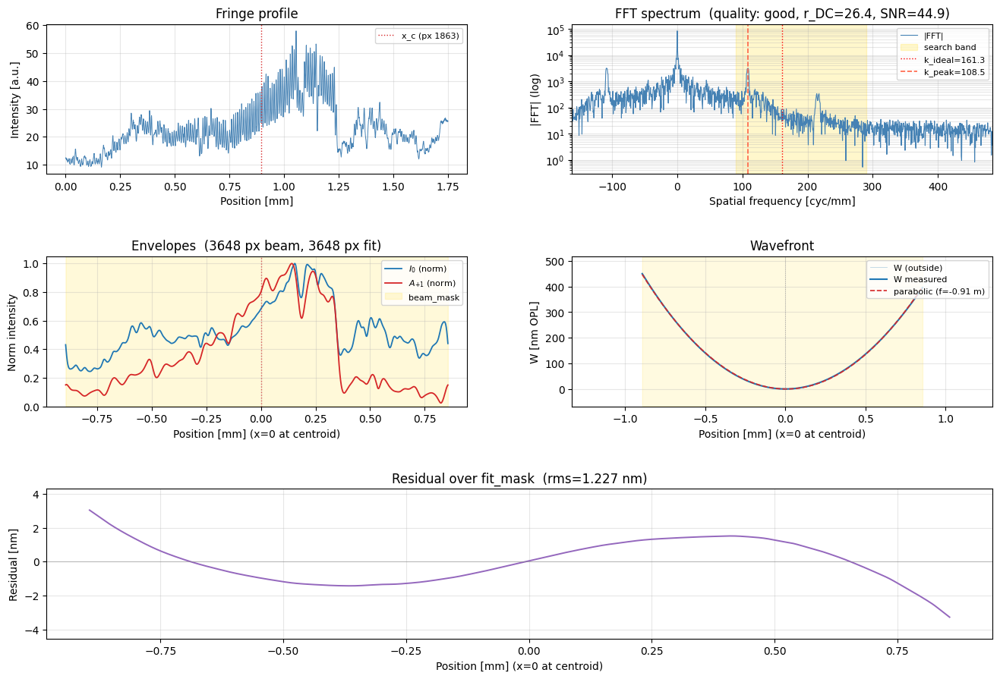

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.2  SNR=44.8  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.232nm


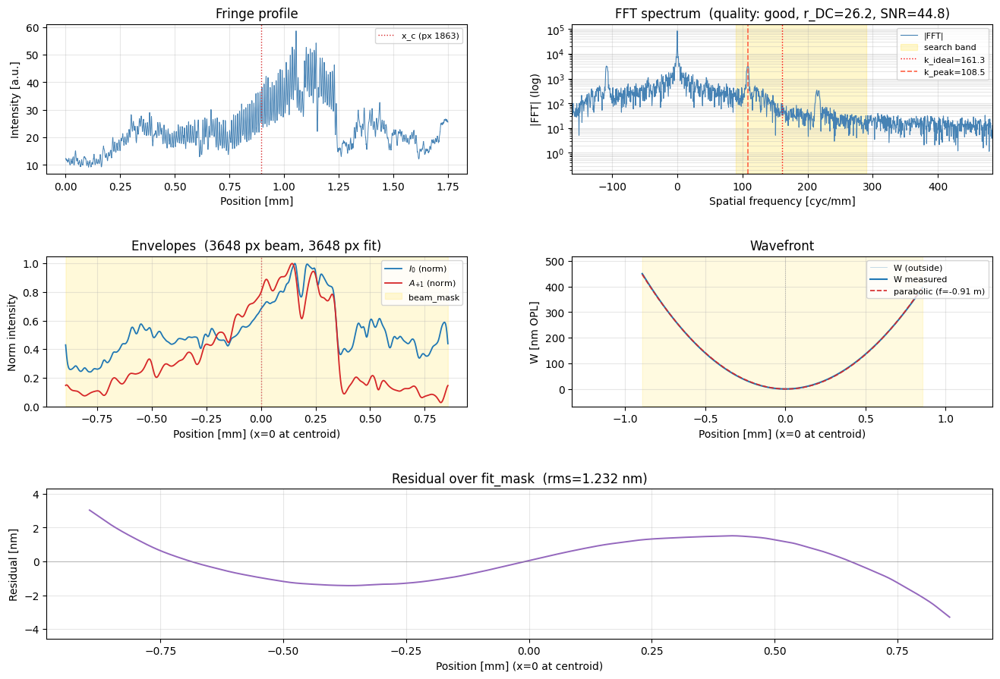

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.1  SNR=43.9  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.242nm


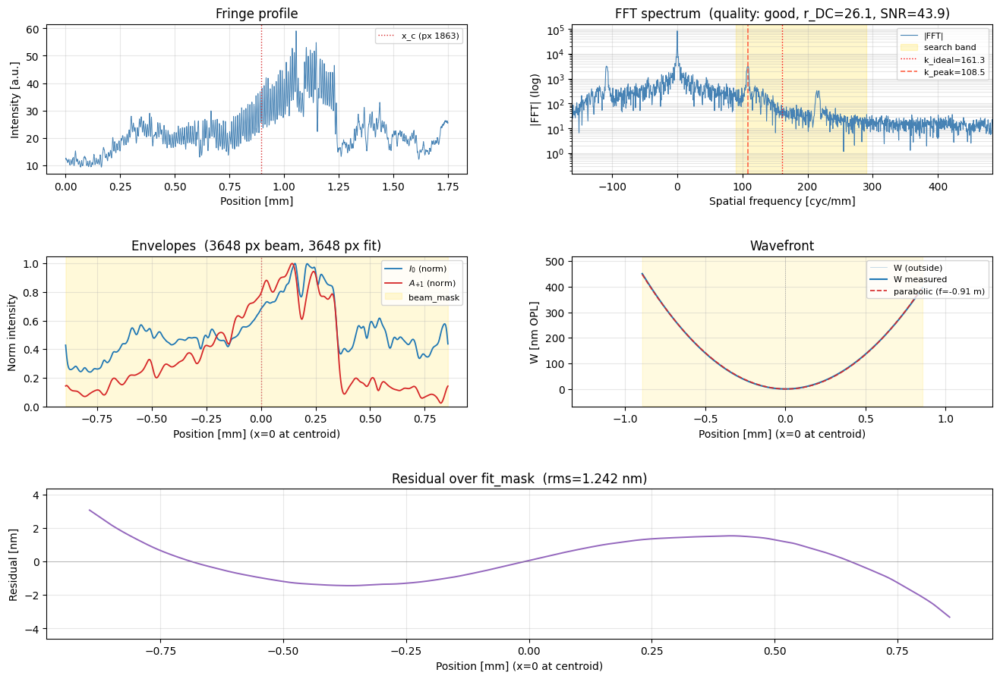

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=25.8  SNR=44.6  f_pred=-0.91m  RMS_W=127.0nm  RMS_resid=1.256nm


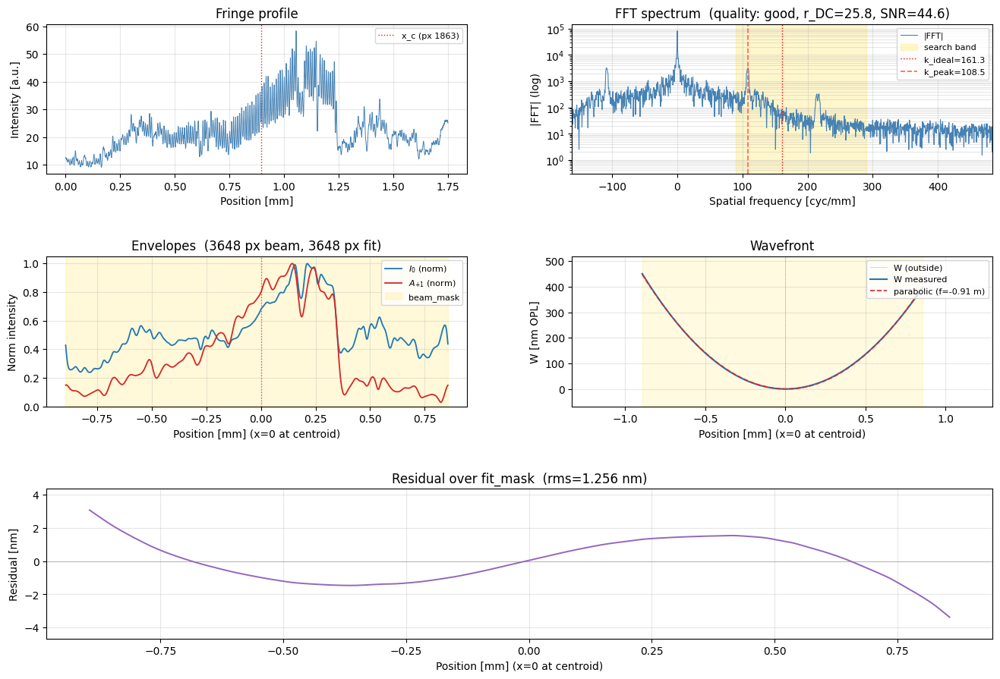

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=26.0  SNR=44.1  f_pred=-0.90m  RMS_W=127.1nm  RMS_resid=1.275nm


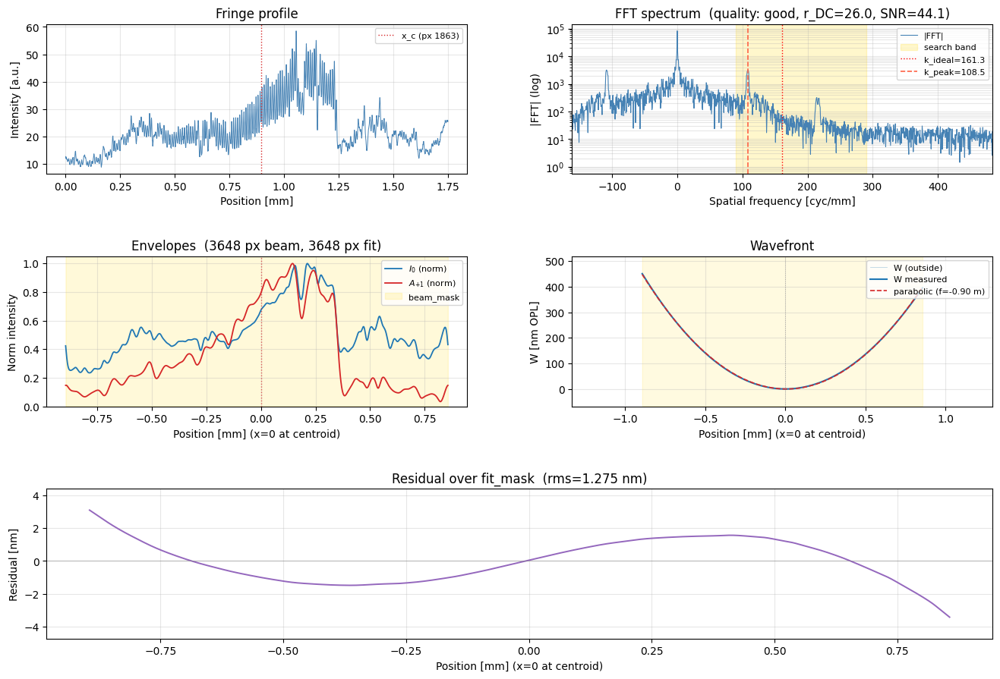

In [239]:
y_roi = slice(440, 460)

r_quick_0 = wfl.quick_look(
    images[0], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
    y_roi=y_roi, axis=1, propagate=False, V_threshold=0.4
)

x_c_ref = r_quick_0['x_c']
print(x_c_ref)

x_c_ref = r_quick_0['x_c']

wfs_quicks = []
for img in images:
    r_quick = wfl.quick_look(
        img, dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
        x_c_override = x_c_ref, 
        y_roi=y_roi, axis=1, propagate=False, V_threshold=0
    )
    wfs_quicks.append(r_quick)

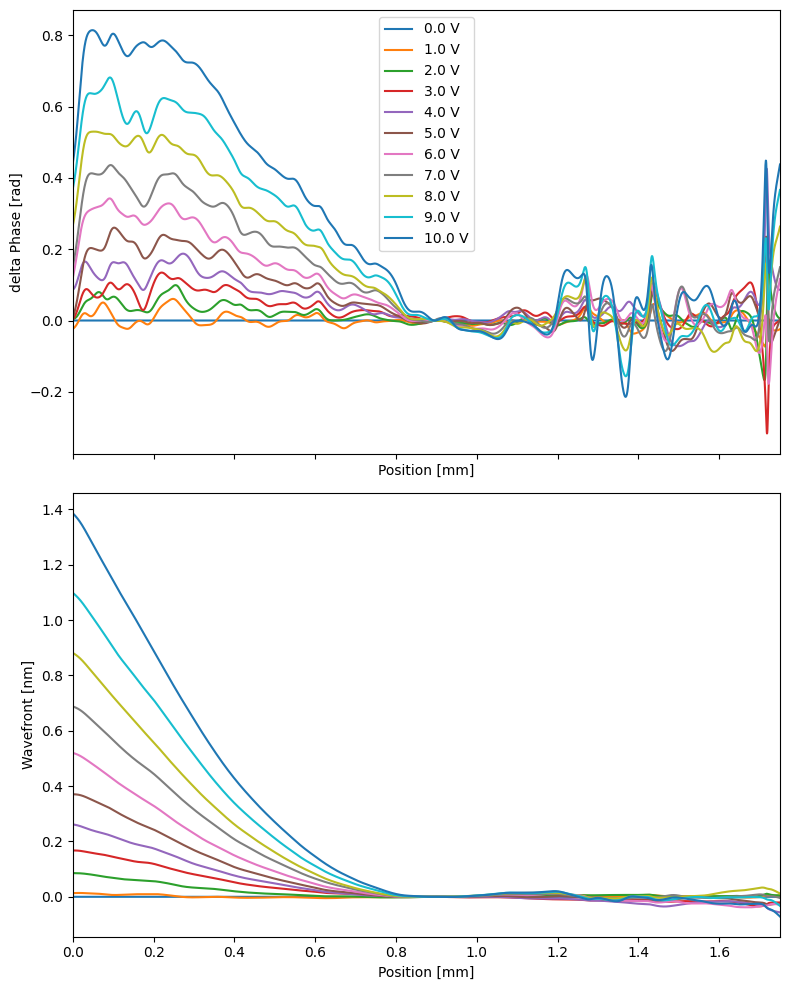

In [240]:
fig, axes = plt.subplots(2, 1, figsize=(8, 10), sharex=True)

for i in range(11):
    delta_phi = wfs_quicks[i]['delta_phi'] - wfs_quicks[0]['delta_phi']
    axes[0].plot(x_m*1e3, delta_phi, label=f'{voltage[i]:.1f} V')
axes[0].set_xlabel('Position [mm]')
axes[0].set_ylabel('delta Phase [rad]')
axes[0].set_xlim([x_m[0]*1e3, x_m[-1]*1e3])
axes[0].legend()

for i in range(11):
    delta_W = wfs_quicks[i]['W_nm'] - wfs_quicks[0]['W_nm']
    axes[1].plot(x_m*1e3, delta_W, label=f'{voltage[i]:.1f} V')
axes[1].set_xlabel('Position [mm]')
axes[1].set_ylabel('Wavefront [nm]')
# axes[1].legend()

plt.tight_layout()
plt.show()

[good]  λ=0.15nm  k_peak=107.9 cyc/mm  r_DC=34.5  SNR=46.5  f_pred=-0.89m  RMS_W=133.8nm  RMS_resid=1.071nm


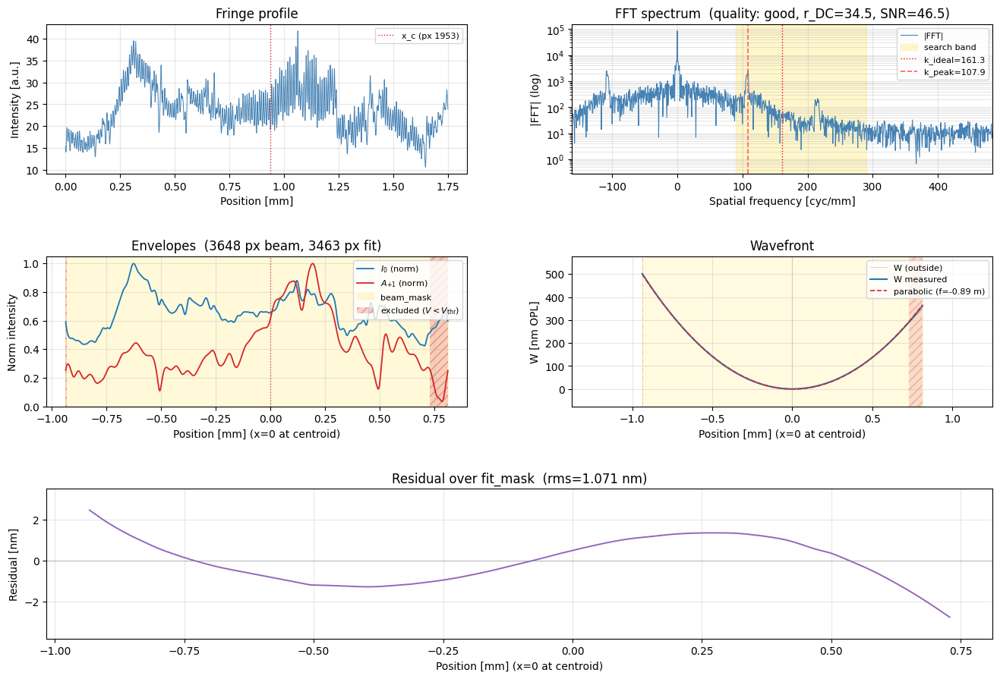

1953
[good]  λ=0.15nm  k_peak=107.9 cyc/mm  r_DC=34.5  SNR=46.5  f_pred=-0.89m  RMS_W=133.8nm  RMS_resid=1.231nm


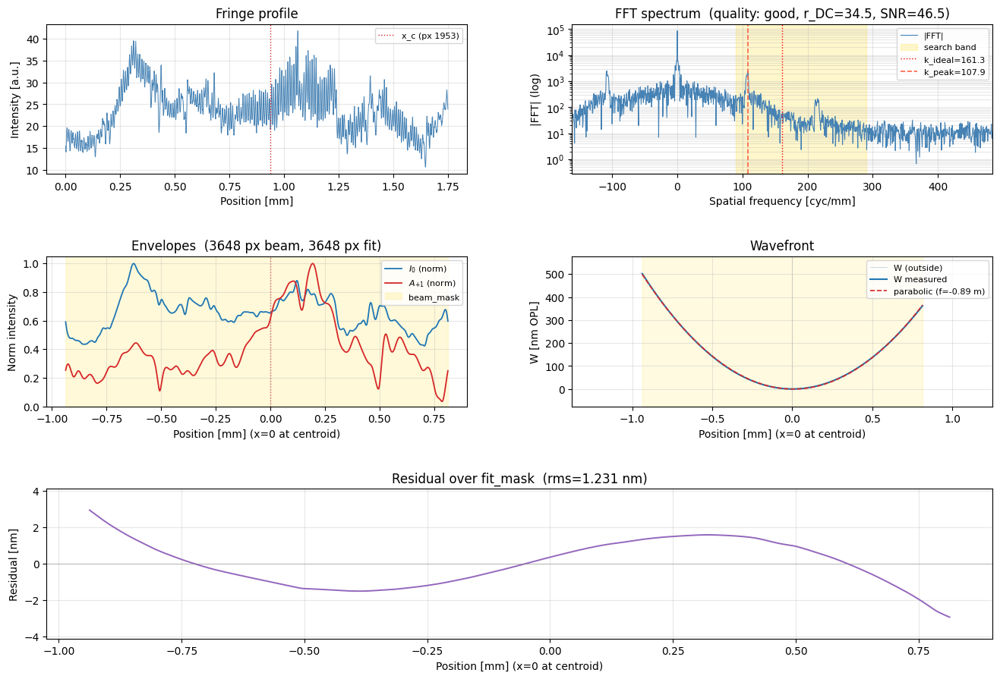

[good]  λ=0.15nm  k_peak=107.9 cyc/mm  r_DC=34.8  SNR=45.0  f_pred=-0.89m  RMS_W=133.9nm  RMS_resid=1.236nm


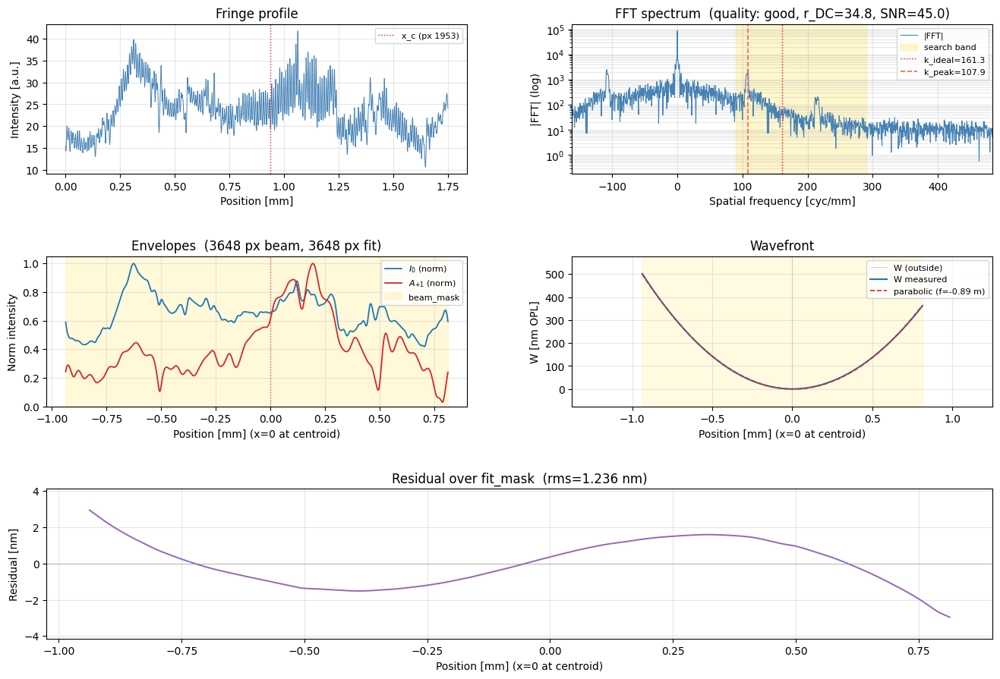

[good]  λ=0.15nm  k_peak=107.9 cyc/mm  r_DC=34.8  SNR=45.0  f_pred=-0.89m  RMS_W=133.9nm  RMS_resid=1.235nm


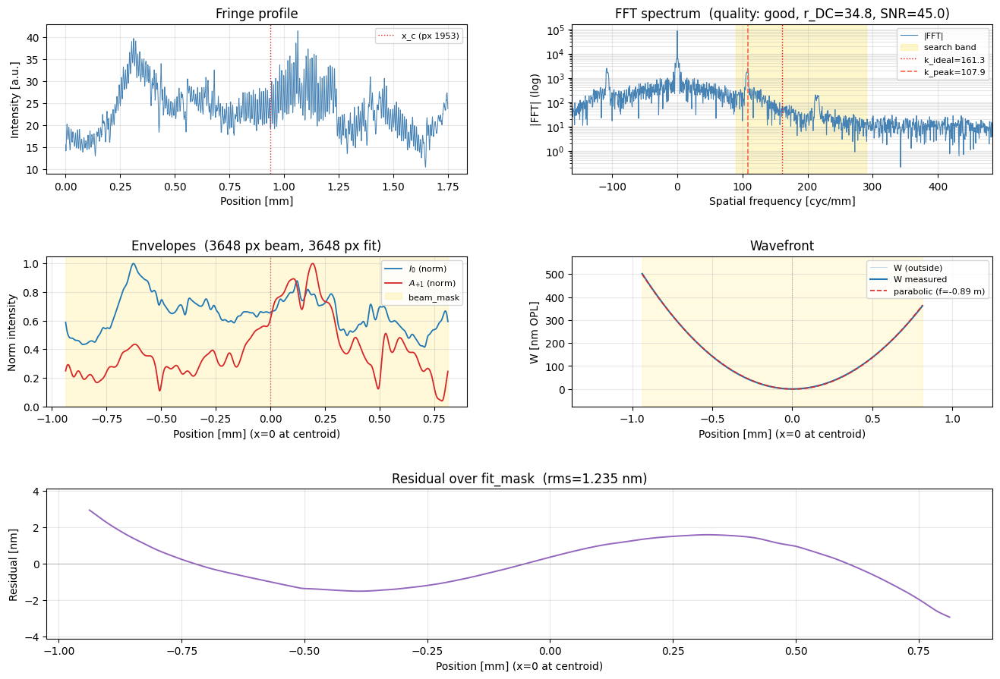

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=34.7  SNR=46.4  f_pred=-0.89m  RMS_W=133.9nm  RMS_resid=1.243nm


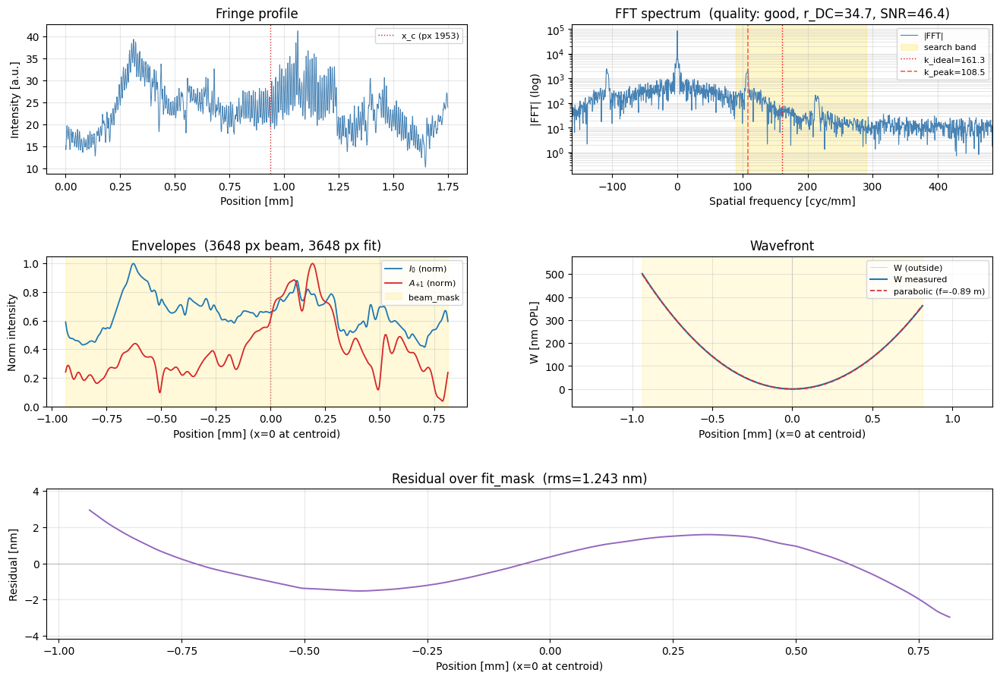

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=34.5  SNR=45.9  f_pred=-0.89m  RMS_W=133.9nm  RMS_resid=1.251nm


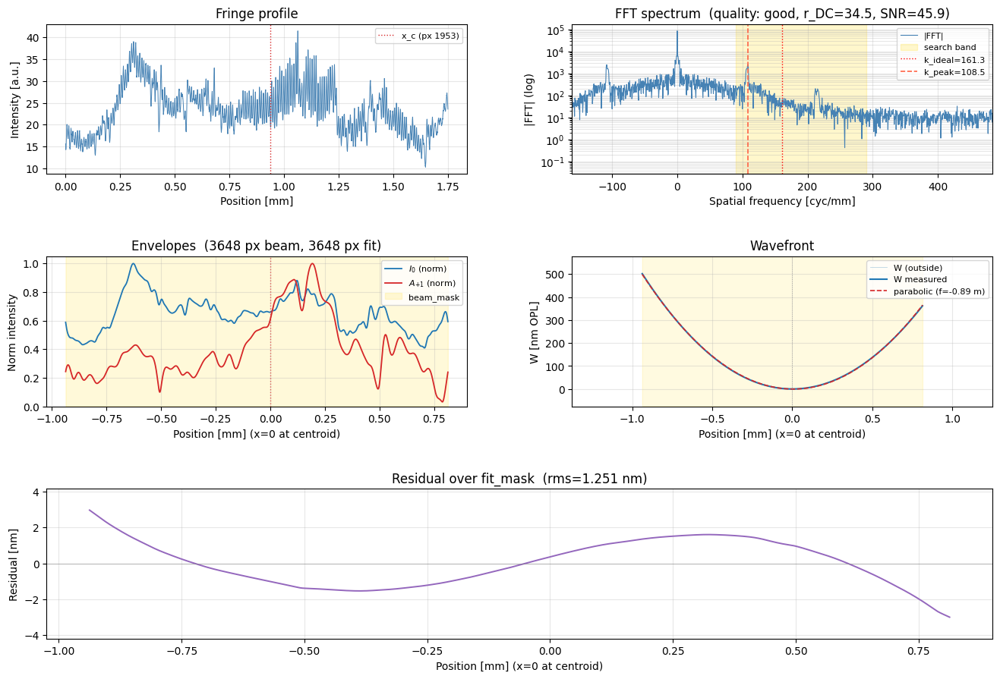

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=36.6  SNR=48.8  f_pred=-0.89m  RMS_W=134.0nm  RMS_resid=1.258nm


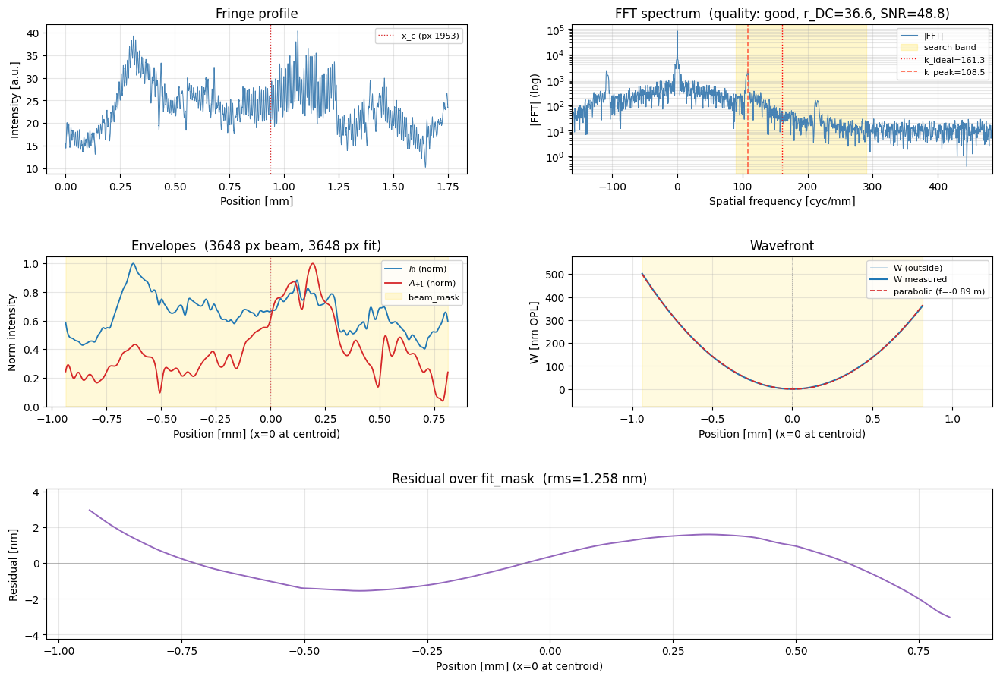

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=33.8  SNR=47.7  f_pred=-0.89m  RMS_W=134.0nm  RMS_resid=1.266nm


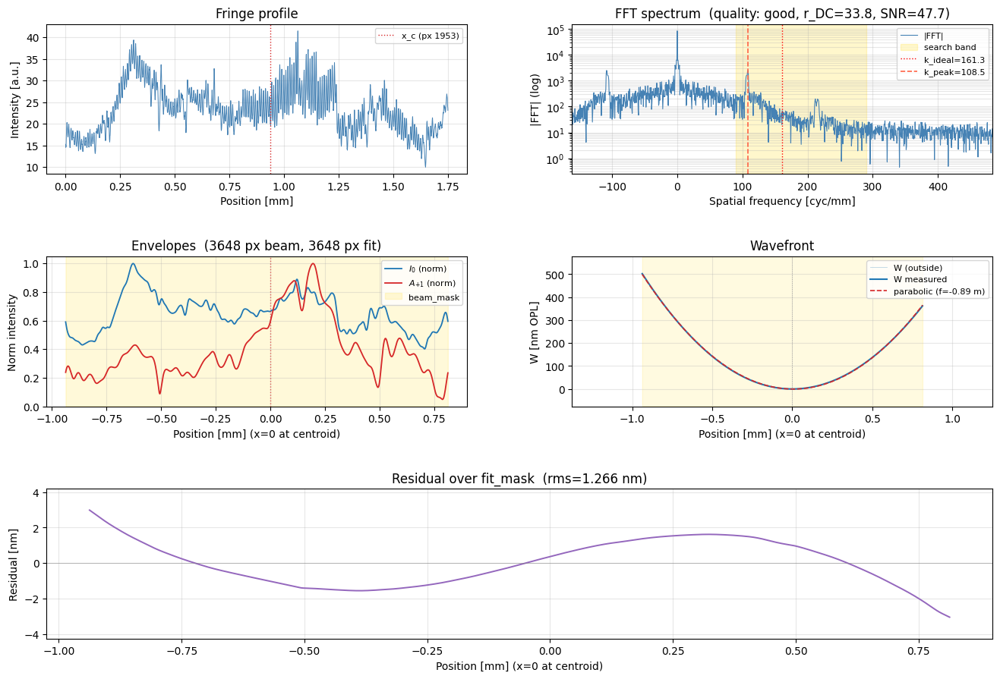

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=33.3  SNR=47.7  f_pred=-0.89m  RMS_W=134.0nm  RMS_resid=1.272nm


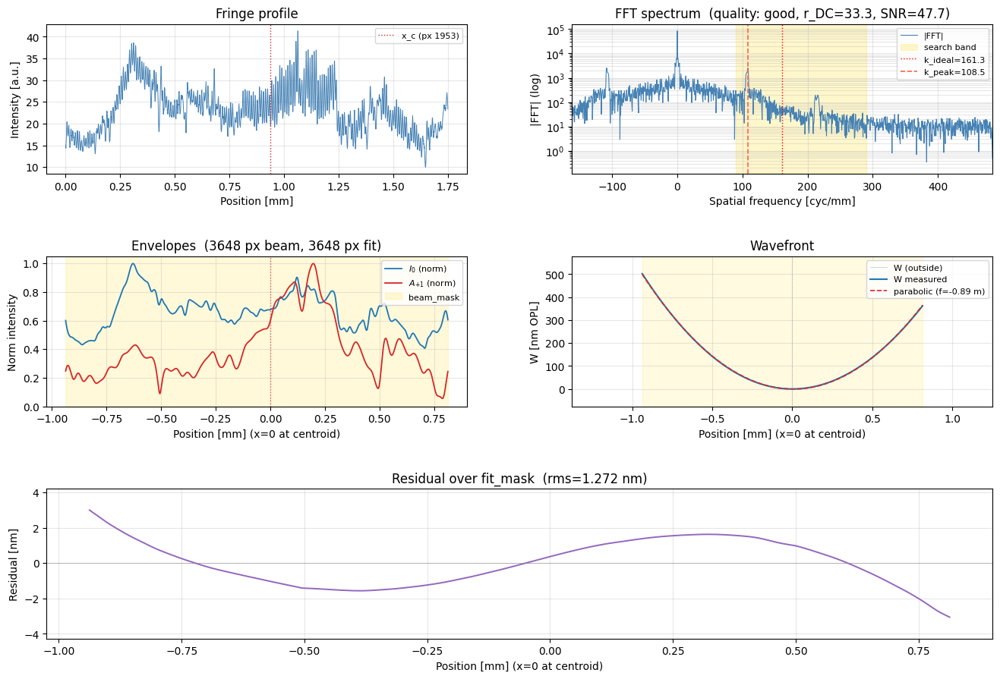

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=33.0  SNR=47.8  f_pred=-0.89m  RMS_W=134.1nm  RMS_resid=1.282nm


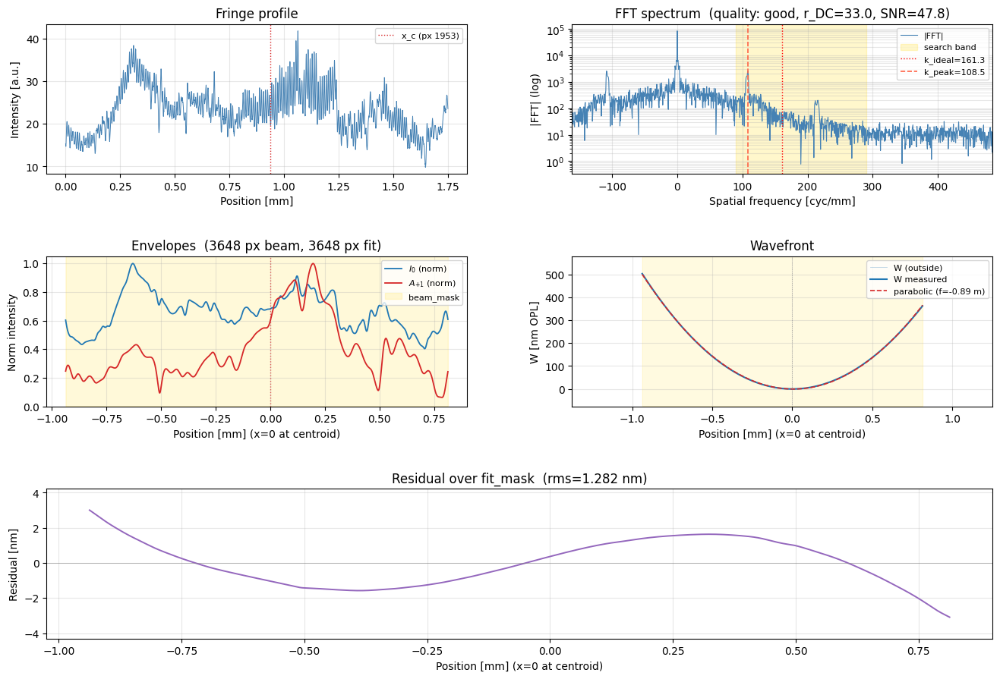

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=32.4  SNR=48.2  f_pred=-0.89m  RMS_W=134.1nm  RMS_resid=1.297nm


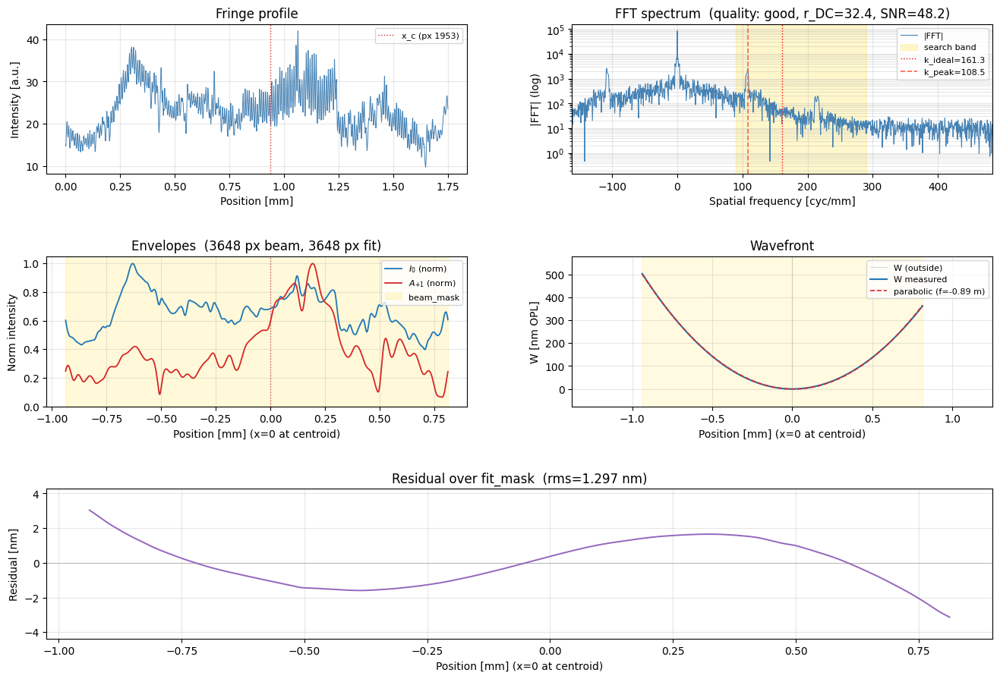

[good]  λ=0.15nm  k_peak=108.5 cyc/mm  r_DC=31.6  SNR=49.2  f_pred=-0.89m  RMS_W=134.2nm  RMS_resid=1.310nm


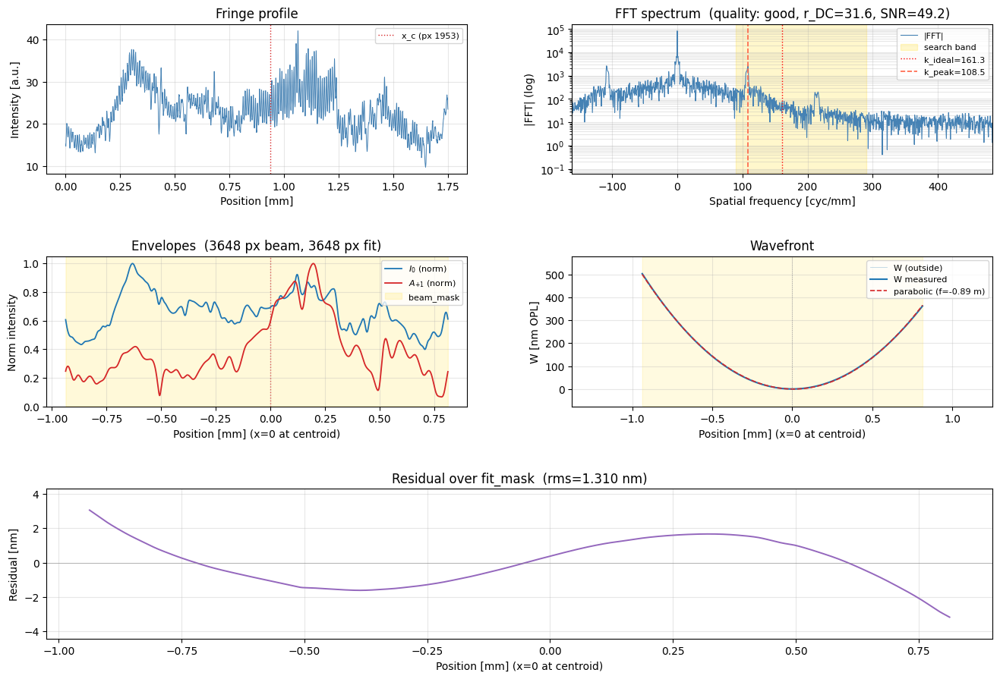

In [260]:
y_roi = slice(500, 520)

r_quick_0 = wfl.quick_look(
    images[0], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
    y_roi=y_roi, axis=1, propagate=False, V_threshold=0.4
)

x_c_ref = r_quick_0['x_c']
print(x_c_ref)

x_c_ref = r_quick_0['x_c']

wfs_quicks = []
for img in images:
    r_quick = wfl.quick_look(
        img, dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
        x_c_override = x_c_ref, 
        y_roi=y_roi, axis=1, propagate=False, V_threshold=0
    )
    wfs_quicks.append(r_quick)

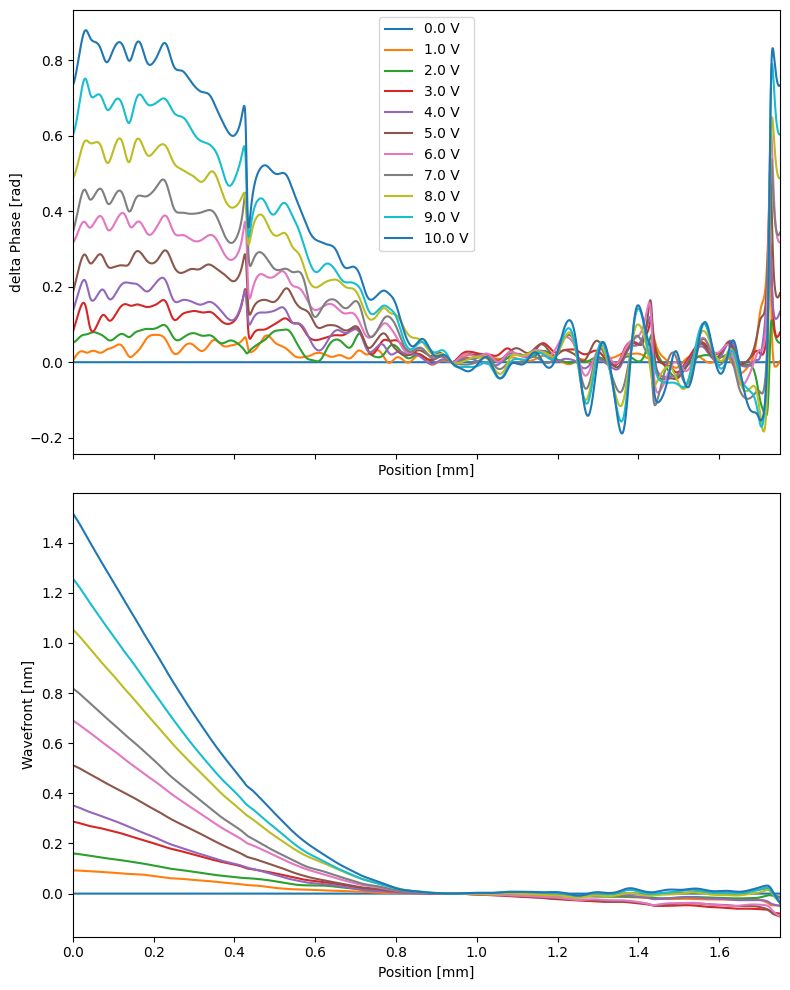

In [263]:
fig, axes = plt.subplots(2, 1, figsize=(8, 10), sharex=True)

for i in range(11):
    delta_phi = wfs_quicks[i]['delta_phi'] - wfs_quicks[0]['delta_phi']
    axes[0].plot(x_m*1e3, delta_phi, label=f'{voltage[i]:.1f} V')
axes[0].set_xlabel('Position [mm]')
axes[0].set_ylabel('delta Phase [rad]')
axes[0].set_xlim([x_m[0]*1e3, x_m[-1]*1e3])
axes[0].legend()

for i in range(11):
    delta_W = wfs_quicks[i]['W_nm'] - wfs_quicks[0]['W_nm']
    axes[1].plot(x_m*1e3, delta_W, label=f'{voltage[i]:.1f} V')
axes[1].set_xlabel('Position [mm]')
axes[1].set_ylabel('Wavefront [nm]')
# axes[1].legend()

plt.tight_layout()
plt.show()

## Single Motor, 10 Frames per Voltage

In [311]:
uid = '9c4a2d90-3a9f-4806-ab03-f64aaa83e057'
db = tiled_client[uid]['primary']
images = db['basler_5472_image'].read()
voltage = db['galil_voltage_readback'].read()

n_positions = 11
n_repeats = 10

# Reshape flat (110, H, W) into (11, 10, H, W)
images = np.array(images).reshape(n_positions, n_repeats, *images.shape[1:])
voltage = np.array(voltage).reshape(n_positions, n_repeats)

In [312]:
y_roi = slice(440, 460)

# Reference x_c from position 0, repeat 0
r_quick_0 = wfl.reconstruct_single(
    images[0, 0], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
    y_roi=y_roi, axis=1, propagate=False, V_threshold=0.4
)
x_c_ref = r_quick_0['x_c']
print(x_c_ref)

wfs_repeats = []
for j in range(n_repeats):
    r_quick = wfl.reconstruct_single(
        images[0, j], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
        x_c_override=x_c_ref,   # Change this to overide 
        y_roi=y_roi, axis=1, propagate=False, V_threshold=0
    )
    wfs_repeats.append(r_quick)

1800


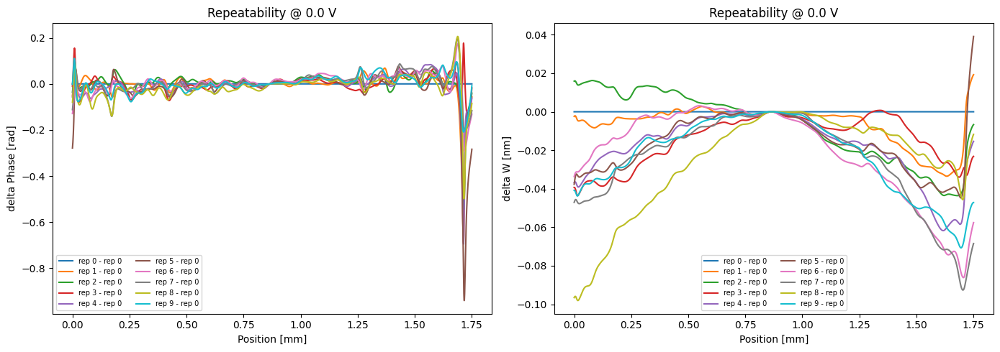

In [334]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for j in range(n_repeats):
    delta_phi_jj = wfs_repeats[j]['delta_phi'] - wfs_repeats[0]['delta_phi']
    axes[0].plot(x_m*1e3, delta_phi_jj, label=f'rep {j} - rep 0')
axes[0].set_xlabel('Position [mm]')
axes[0].set_ylabel('delta Phase [rad]')
axes[0].set_title(f'Repeatability @ {voltage[0, 0]:.1f} V')
axes[0].legend(fontsize=7, ncol=2)

for j in range(n_repeats):
    delta_W_jj = wfs_repeats[j]['W_nm'] - wfs_repeats[0]['W_nm']
    axes[1].plot(x_m*1e3, delta_W_jj, label=f'rep {j} - rep 0')
axes[1].set_xlabel('Position [mm]')
axes[1].set_ylabel('delta W [nm]')
axes[1].set_title(f'Repeatability @ {voltage[0, 0]:.1f} V')
axes[1].legend(fontsize=7, ncol=2)

plt.tight_layout()
plt.show()

In [315]:
wfs_quicks = []
for i in range(n_positions):
    r_quick = wfl.reconstruct_single(
        images[i, 0], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
        x_c_override=x_c_ref,
        y_roi=y_roi, axis=1, propagate=False, V_threshold=0
    )
    wfs_quicks.append(r_quick)


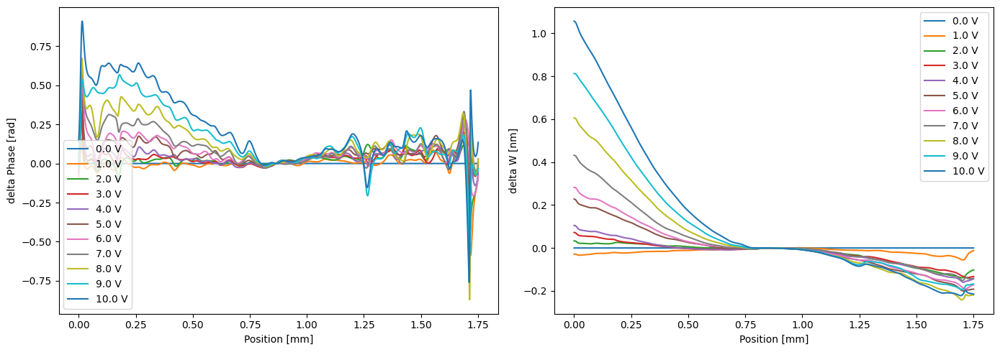

In [316]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for i in range(n_positions):
    delta_phi = wfs_quicks[i]['delta_phi'] - wfs_quicks[0]['delta_phi']
    axes[0].plot(x_m*1e3, delta_phi, label=f'{voltage[i, 0]:.1f} V')
axes[0].set_xlabel('Position [mm]')
axes[0].set_ylabel('delta Phase [rad]')
axes[0].legend()

for i in range(n_positions):
    delta_W = wfs_quicks[i]['W_nm'] - wfs_quicks[0]['W_nm']
    axes[1].plot(x_m*1e3, delta_W, label=f'{voltage[i, 0]:.1f} V')
axes[1].set_xlabel('Position [mm]')
axes[1].set_ylabel('delta W [nm]')
axes[1].legend()

plt.tight_layout()
plt.show()

In [317]:
# Average images across repeats: (11, 10, H, W) -> (11, H, W)
images_avg = images.mean(axis=1)

wfs_quicks_avg = []
for i in range(n_positions):
    r_quick = wfl.reconstruct_single(
        images_avg[i], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
        x_c_override=x_c_ref,
        y_roi=y_roi, axis=1, propagate=False, V_threshold=0
    )
    wfs_quicks_avg.append(r_quick)

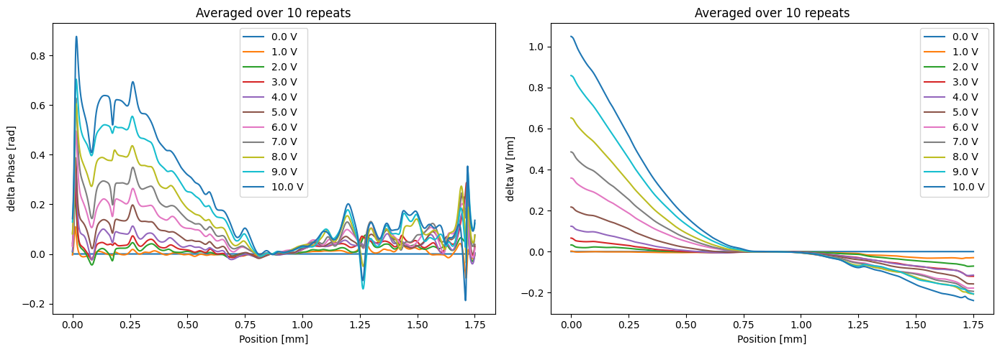

In [318]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for i in range(n_positions):
    delta_phi = wfs_quicks_avg[i]['delta_phi'] - wfs_quicks_avg[0]['delta_phi']
    axes[0].plot(x_m*1e3, delta_phi, label=f'{voltage[i, 0]:.1f} V')
axes[0].set_xlabel('Position [mm]')
axes[0].set_ylabel('delta Phase [rad]')
axes[0].set_title('Averaged over 10 repeats')
axes[0].legend()

for i in range(n_positions):
    delta_W = wfs_quicks_avg[i]['W_nm'] - wfs_quicks_avg[0]['W_nm']
    axes[1].plot(x_m*1e3, delta_W, label=f'{voltage[i, 0]:.1f} V')
axes[1].set_xlabel('Position [mm]')
axes[1].set_ylabel('delta W [nm]')
axes[1].set_title('Averaged over 10 repeats')
axes[1].legend()

plt.tight_layout()
plt.show()

In [319]:
# Compute quick_look for every individual frame (11 positions x 10 repeats)
wfs_quicks_all = []
for i in range(n_positions):
    repeats = []
    for j in range(n_repeats):
        r_quick = wfl.reconstruct_single(
            images[i, j], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=1.8,
            x_c_override=x_c_ref,
            y_roi=y_roi, axis=1, propagate=False, V_threshold=0
        )
        repeats.append(r_quick)
    wfs_quicks_all.append(repeats)

# Average delta_phi and W_nm across repeats, per position
wfs_quicks_avg2 = []
for i in range(n_positions):
    delta_phi_mean = np.mean([wfs_quicks_all[i][j]['delta_phi'] for j in range(n_repeats)], axis=0)
    W_nm_mean = np.mean([wfs_quicks_all[i][j]['W_nm'] for j in range(n_repeats)], axis=0)
    wfs_quicks_avg2.append({'delta_phi': delta_phi_mean, 'W_nm': W_nm_mean})

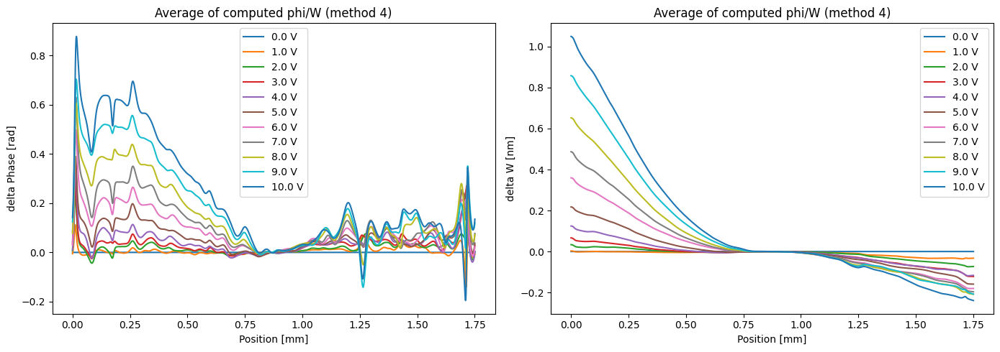

In [320]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for i in range(n_positions):
    delta_phi = wfs_quicks_avg2[i]['delta_phi'] - wfs_quicks_avg2[0]['delta_phi']
    axes[0].plot(x_m*1e3, delta_phi, label=f'{voltage[i, 0]:.1f} V')
axes[0].set_xlabel('Position [mm]')
axes[0].set_ylabel('delta Phase [rad]')
axes[0].set_title('Average of computed phi/W (method 4)')
axes[0].legend()

for i in range(n_positions):
    delta_W = wfs_quicks_avg2[i]['W_nm'] - wfs_quicks_avg2[0]['W_nm']
    axes[1].plot(x_m*1e3, delta_W, label=f'{voltage[i, 0]:.1f} V')
axes[1].set_xlabel('Position [mm]')
axes[1].set_ylabel('delta W [nm]')
axes[1].set_title('Average of computed phi/W (method 4)')
axes[1].legend()

plt.tight_layout()
plt.show()

## Dual Motors, 10 Frames per Voltage

In [13]:
uid = '1b359a54-9004-4d23-8dd7-1bb72cdeeeda'
db = tiled_client[uid]['primary']
images = db['basler_5472_image'].read()
voltage_AO0 = db['galil_voltage_readback'].read()    # from voltage_motor
voltage_AO4 = db['galil_voltage_4_readback'].read()  # from voltage_motor_4 -- confirm field name

n_AO0 = 11      # voltage_motor steps
n_AO4 = 11      # voltage_motor_4 steps
n_repeats = 10

# Reshape flat (1210, H, W) -> (11, 11, 10, H, W)
images = np.array(images).reshape(n_AO0, n_AO4, n_repeats, *images.shape[1:])
voltage_AO0 = np.array(voltage_AO0).reshape(n_AO0, n_AO4, n_repeats)
voltage_AO4 = np.array(voltage_AO4).reshape(n_AO0, n_AO4, n_repeats)

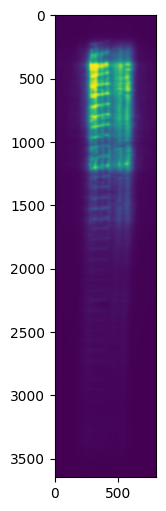

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

test_img = images[0, 10, 0]

# Plot 1: whole image
plt.figure(figsize=(8, 6))
plt.imshow(test_img)
plt.show()


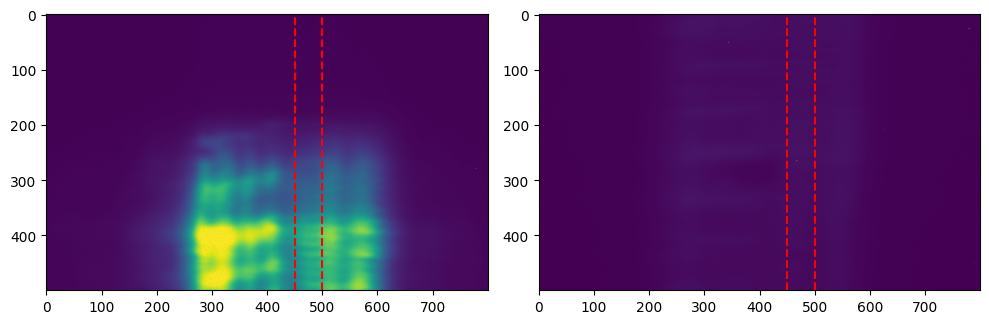

In [51]:
# Plot 2: two subplots, top and bottom regions, sharing x-axis
fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharex=True)

axes[0].imshow(test_img[0:500])
axes[0].axvline(450, color='r', linestyle='--')
axes[0].axvline(500, color='r', linestyle='--')

axes[1].imshow(test_img[2000:2500])
axes[1].axvline(450, color='r', linestyle='--')
axes[1].axvline(500, color='r', linestyle='--')

plt.tight_layout()
plt.show()

[ bad]  λ=0.15nm  k_peak=114.8 cyc/mm  r_DC=245.8  SNR=19.4  f_pred=-1.05m  RMS_W=19.4nm  RMS_resid=0.371nm


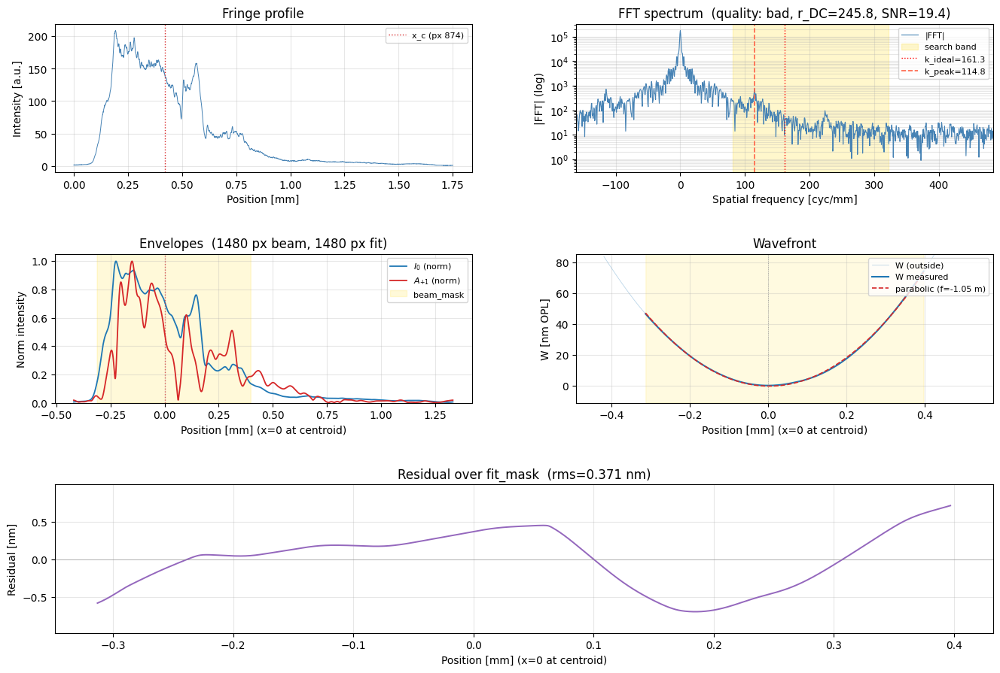

874


In [52]:
y_roi = slice(500, 520)

r_quick_0 = wfl.quick_look(
    test_img, dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=2,
    y_roi=y_roi, axis=1, propagate=False, V_threshold=0
)

x_c_ref = r_quick_0['x_c']
print(x_c_ref)

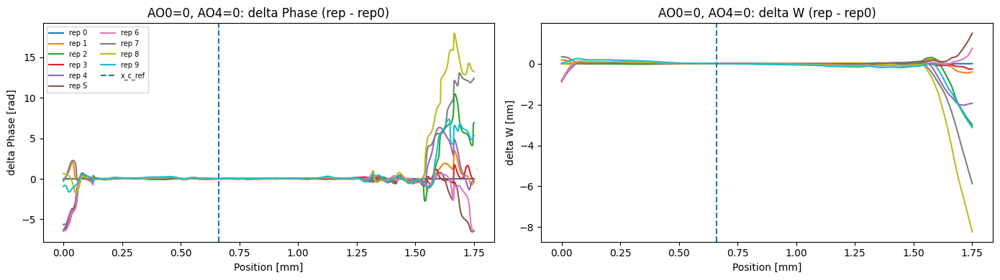

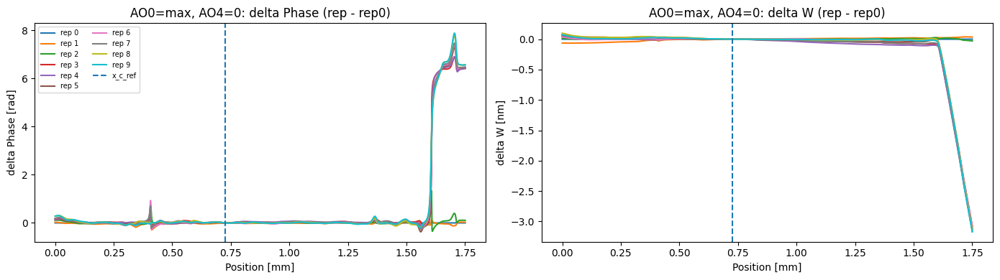

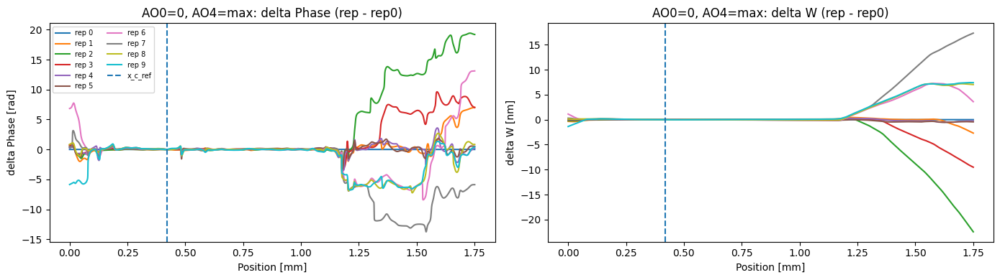

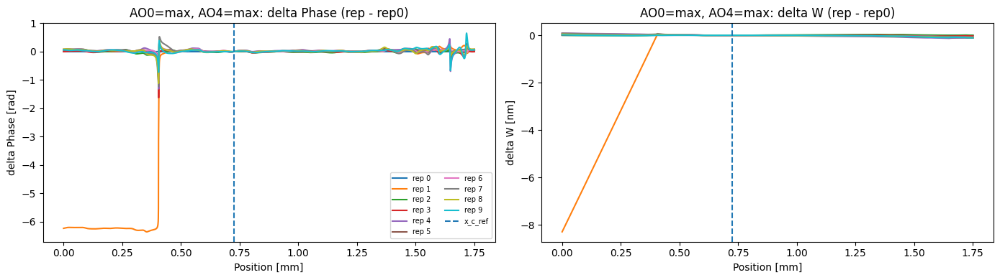

In [69]:
# Repeatability test

test_sets = {
    'AO0=0, AO4=0': images[0, 0, :],
    'AO0=max, AO4=0': images[10, 0, :],
    'AO0=0, AO4=max': images[0, 10, :],
    'AO0=max, AO4=max': images[10, 10, :],
}

for label, img_set in test_sets.items():
    wfs_test = []
    for j in range(n_repeats):
        r0 = wfl.reconstruct_single(
            img_set[0], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=2,
            y_roi=y_roi, axis=1, propagate=False, V_threshold=0
        )
        x_c_ref = r0['x_c']  # Update x_c_ref for each test set

        r = wfl.reconstruct_single(
            img_set[j], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=2,
            x_c_override=x_c_ref,
            y_roi=y_roi, axis=1, propagate=False, V_threshold=0
        )
        wfs_test.append(r)

    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    for j in range(n_repeats):
        axes[0].plot(x_m*1e3, wfs_test[j]['delta_phi'] - wfs_test[0]['delta_phi'], label=f'rep {j}')
    axes[0].axvline(x_c_ref*dx_m*1e3, linestyle='--', label='x_c_ref')
    axes[0].set_title(f'{label}: delta Phase (rep - rep0)')
    axes[0].set_xlabel('Position [mm]')
    axes[0].set_ylabel('delta Phase [rad]')
    axes[0].legend(fontsize=7, ncol=2)
    # axes[0].set_ylim(-.5,.5)

    for j in range(n_repeats):
        axes[1].plot(x_m*1e3, wfs_test[j]['W_nm'] - wfs_test[0]['W_nm'], label=f'rep {j}')
    axes[1].axvline(x_c_ref*dx_m*1e3, linestyle='--', label='x_c_ref')
    axes[1].set_title(f'{label}: delta W (rep - rep0)')
    axes[1].set_xlabel('Position [mm]')
    axes[1].set_ylabel('delta W [nm]')
    # axes[1].set_ylim(-.5,.5)
    # axes[1].legend(fontsize=7, ncol=2)
    
    plt.tight_layout(); plt.show()

In [43]:
images_avg = images.mean(axis=2) 


In [ ]:
n_AO0 = 11
n_AO4 = 11

recon_cache = {}

def get_recon(i, j):
    if (i, j) not in recon_cache:
        recon_cache[(i, j)] = wfl.reconstruct_single(
            images_avg[i, j], dx_m, grating_pitch_m, wavelength_m, z_gd_m, band_factor=2,
            y_roi=y_roi, axis=1,
            x_c_override=x_c_ref, V_threshold=0, propagate=False
        )
    return recon_cache[(i, j)]

# Reference at (0, 0)
r_ref = get_recon(0, 0)

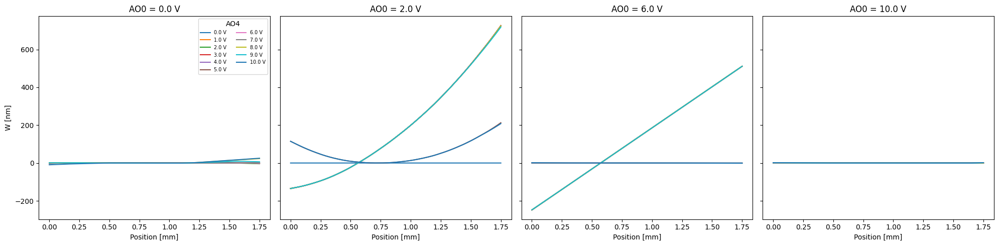

In [63]:
fixed_AO0_idx = [0, 2, 6, 10]

fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharex=True, sharey=True)

for k, i in enumerate(fixed_AO0_idx):
    ax = axes[k]
    r0 = get_recon(i, 0)
    for j in range(n_AO4):
        r = get_recon(i, j)
        delta_W = r['W_nm'] - r0['W_nm']
        ax.plot(x_m*1e3, delta_W, label=f'{voltage_AO4[i, j, 0]:.1f} V')
    ax.set_title(f'AO0 = {voltage_AO0[i, 0, 0]:.1f} V')
    ax.set_xlabel('Position [mm]')
    if k == 0:
        ax.set_ylabel('W [nm]')
        ax.legend(fontsize=7, ncol=2, title='AO4')

plt.tight_layout()
plt.show()

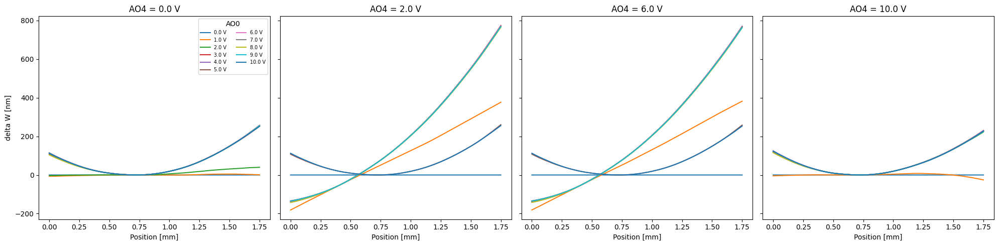

In [64]:
fixed_AO4_idx = [0, 2, 6, 10]

fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharex=True, sharey=True)

for k, j in enumerate(fixed_AO4_idx):
    ax = axes[k]
    r0 = get_recon(0, j)
    for i in range(n_AO0):
        r = get_recon(i, j)
        delta_W = r['W_nm'] - r0['W_nm']
        ax.plot(x_m*1e3, delta_W, label=f'{voltage_AO0[i, j, 0]:.1f} V')
    ax.set_title(f'AO4 = {voltage_AO4[0, j, 0]:.1f} V')
    ax.set_xlabel('Position [mm]')
    if k == 0:
        ax.set_ylabel('delta W [nm]')
        ax.legend(fontsize=7, ncol=2, title='AO0')

plt.tight_layout()
plt.show()